In [1]:
import sys
sys.path.append('../')

import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
from helpers_mom6.collection_of_experiments import CollectionOfExperiments
from helpers.plot_helpers import *
from helpers_mom6.computational_tools import remesh, select_LatLon, Lk_error, x_coord, y_coord, gaussian_remesh
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cmocean
import os

%load_ext autoreload
%autoreload 2
import warnings
warnings.filterwarnings("ignore")
#import hvplot.xarray
import hvplot
hvplot.output(widget_location='bottom')

In [2]:
ds = CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Feb2022/bare', additional_subfolder='output')

In [3]:
ds += CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Apr2023/generalization', additional_subfolder='output')

In [4]:
ds += CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/Apr2023/GZ21_results', additional_subfolder='')

In [5]:
ds += CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/CM26_Double_Gyre/generalization', additional_subfolder='output')

In [6]:
for exp in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']:
    ds.remesh('R64', exp)

Experiment R64 coarsegrained to R2 is created. Its identificator=R64_R2
Experiment R64 coarsegrained to R3 is created. Its identificator=R64_R3
Experiment R64 coarsegrained to R4 is created. Its identificator=R64_R4
Experiment R64 coarsegrained to R5 is created. Its identificator=R64_R5
Experiment R64 coarsegrained to R6 is created. Its identificator=R64_R6
Experiment R64 coarsegrained to R7 is created. Its identificator=R64_R7
Experiment R64 coarsegrained to R8 is created. Its identificator=R64_R8


In [8]:
len(ds.exps)

2095

# Different soft constraints

In [12]:
for k in ds.exps:
    if 'May22-FGR3-subfilter-EXP1-R4' in k:
        print(k)

May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06-smooth-1
May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.01-smooth-4
May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06
May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06-smooth-4
May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.01
May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.01-smooth-1
May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.03
May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.03-smooth-1
May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.03-smooth-4


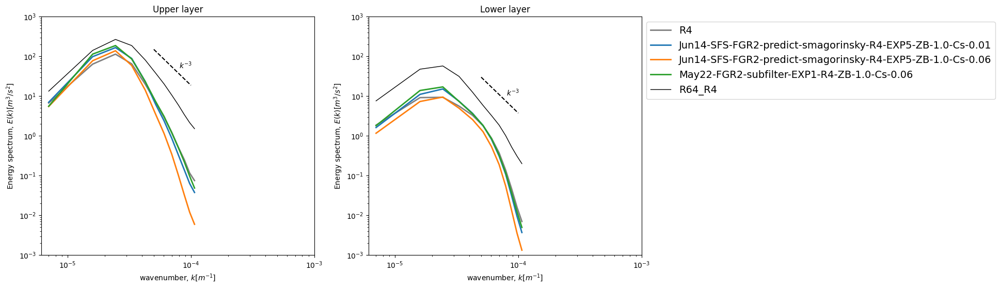

In [12]:
ds.plot_KE_spectrum(['R4',
             'Jun14-SFS-FGR2-predict-smagorinsky-R4-EXP5-ZB-1.0-Cs-0.01',
            'Jun14-SFS-FGR2-predict-smagorinsky-R4-EXP5-ZB-1.0-Cs-0.06',
             'May22-FGR2-subfilter-EXP1-R4-ZB-1.0-Cs-0.06',
            'R64_R4']);

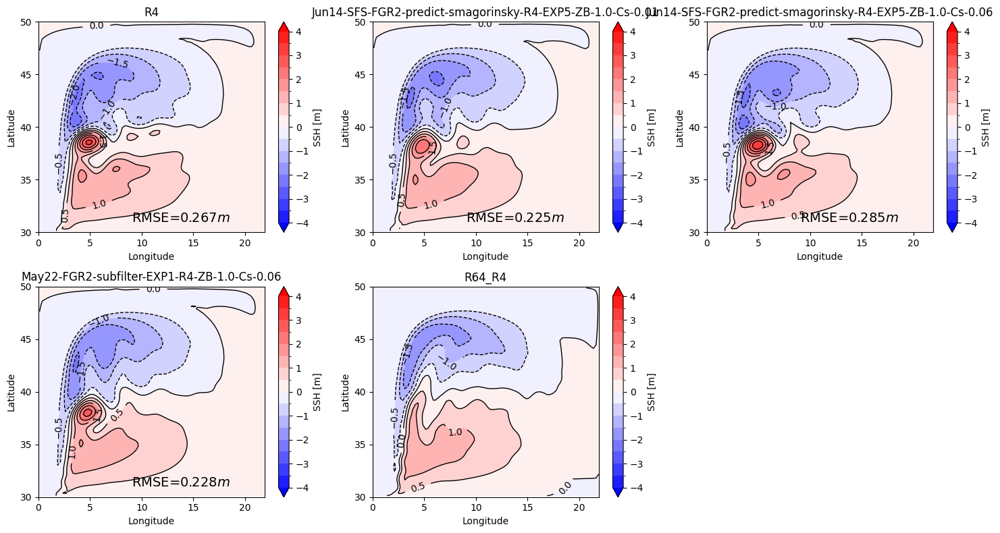

In [14]:
ds.plot_ssh(['R4',
             'Jun14-SFS-FGR2-predict-smagorinsky-R4-EXP5-ZB-1.0-Cs-0.01',
            'Jun14-SFS-FGR2-predict-smagorinsky-R4-EXP5-ZB-1.0-Cs-0.06',
             'May22-FGR2-subfilter-EXP1-R4-ZB-1.0-Cs-0.06',
            'R64_R4']);

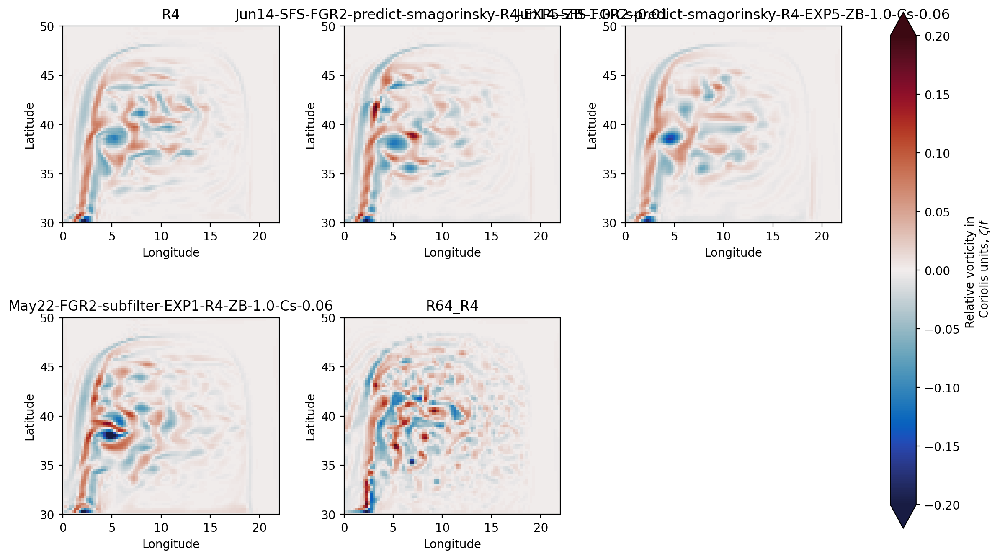

In [13]:
ds.plot_RV(['R4',
             'Jun14-SFS-FGR2-predict-smagorinsky-R4-EXP5-ZB-1.0-Cs-0.01',
            'Jun14-SFS-FGR2-predict-smagorinsky-R4-EXP5-ZB-1.0-Cs-0.06',
             'May22-FGR2-subfilter-EXP1-R4-ZB-1.0-Cs-0.06',
            'R64_R4']);

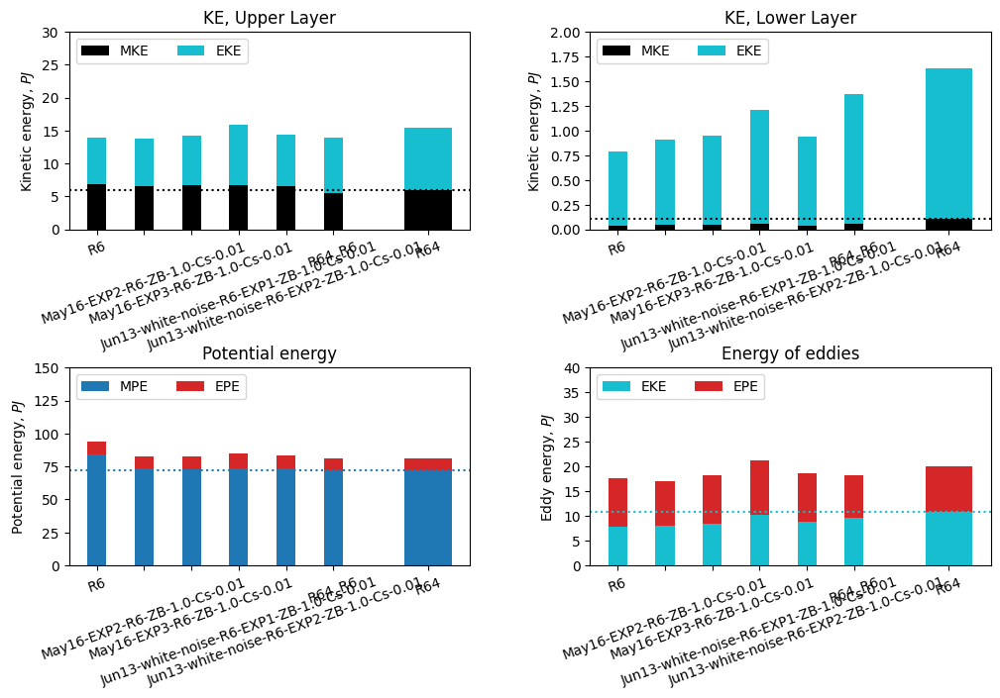

In [71]:
RR='R6'
Cs=0.01
ds.plot_KE_PE([RR, f'May16-EXP2-{RR}-ZB-1.0-Cs-{Cs}', f'May16-EXP3-{RR}-ZB-1.0-Cs-{Cs}', f'Jun13-white-noise-{RR}-EXP1-ZB-1.0-Cs-{Cs}', f'Jun13-white-noise-{RR}-EXP2-ZB-1.0-Cs-{Cs}', f'R64_{RR}', 'R64']);

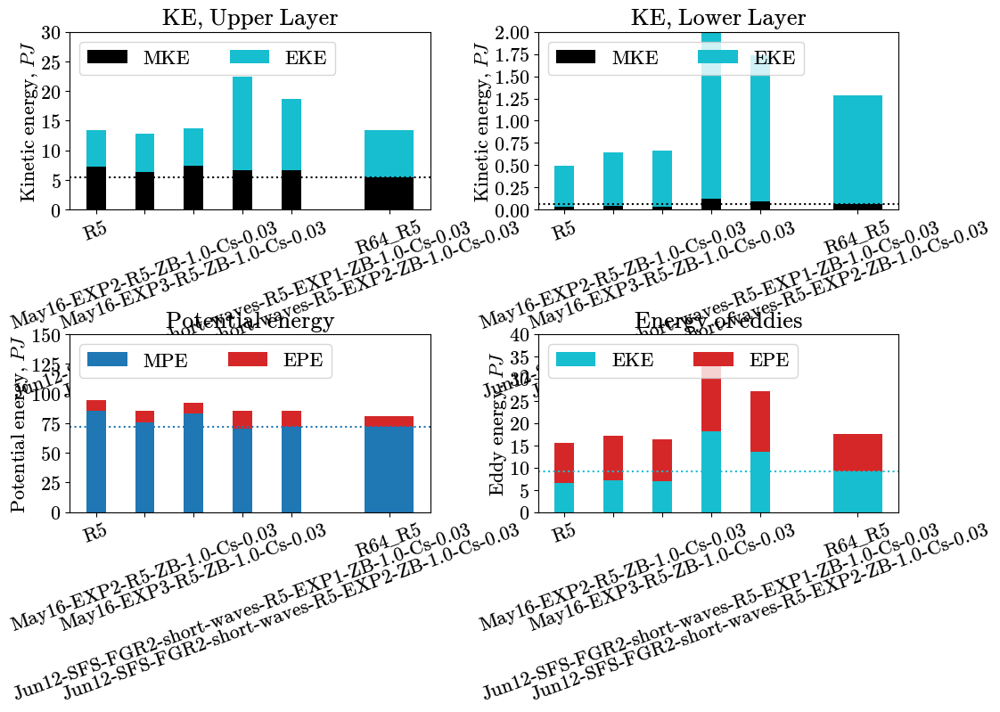

In [53]:
RR='R5'
Cs=0.03
ds.plot_KE_PE([RR, f'May16-EXP2-{RR}-ZB-1.0-Cs-{Cs}', f'May16-EXP3-{RR}-ZB-1.0-Cs-{Cs}', 
            f'Jun12-SFS-FGR2-short-waves-{RR}-EXP1-ZB-1.0-Cs-{Cs}',
            f'Jun12-SFS-FGR2-short-waves-{RR}-EXP2-ZB-1.0-Cs-{Cs}',
            f'R64_{RR}']);

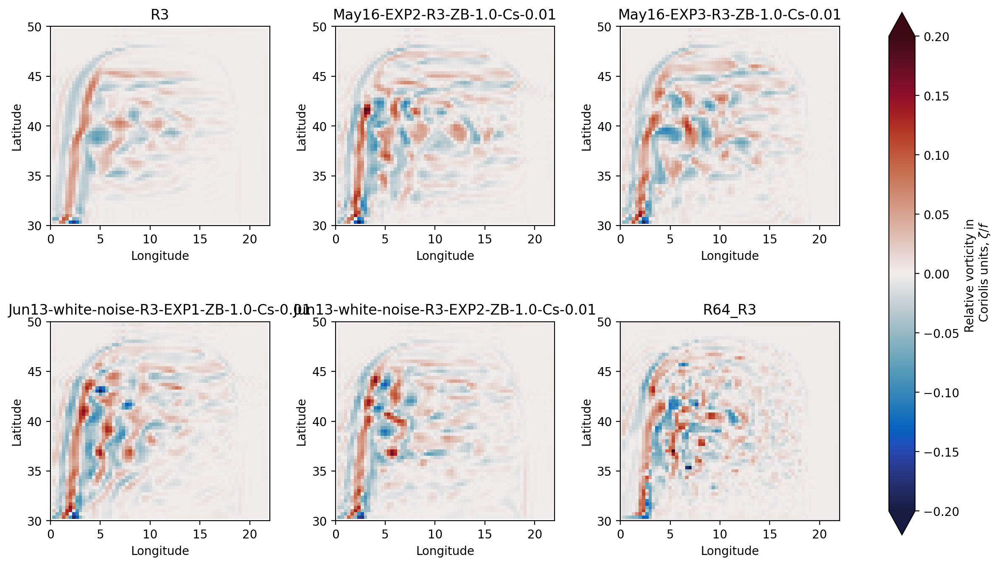

In [76]:
RR='R3'
Cs=0.01
ds.plot_RV([RR, f'May16-EXP2-{RR}-ZB-1.0-Cs-{Cs}', f'May16-EXP3-{RR}-ZB-1.0-Cs-{Cs}', f'Jun13-white-noise-{RR}-EXP1-ZB-1.0-Cs-{Cs}', f'Jun13-white-noise-{RR}-EXP2-ZB-1.0-Cs-{Cs}', f'R64_{RR}']);

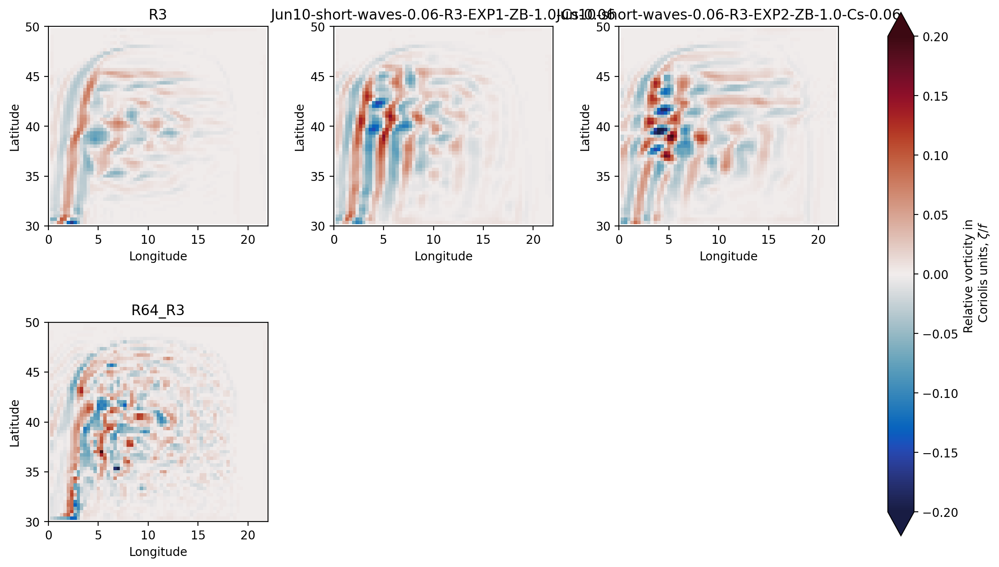

In [12]:
ds.plot_RV(['R3', 'Jun10-short-waves-0.06-R3-EXP1-ZB-1.0-Cs-0.06', 'Jun10-short-waves-0.06-R3-EXP2-ZB-1.0-Cs-0.06',
            'R64_R3'])

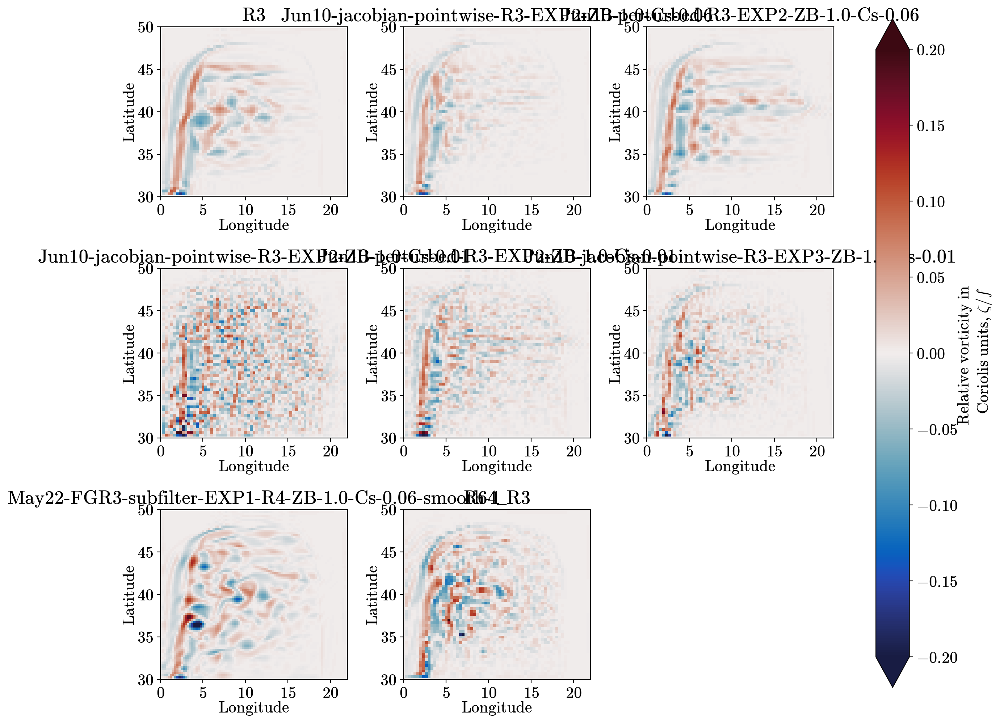

In [95]:
ds.plot_RV(['R3', 'Jun10-jacobian-pointwise-R3-EXP2-ZB-1.0-Cs-0.06', 'Jun10-perturbed-R3-EXP2-ZB-1.0-Cs-0.06', 'Jun10-jacobian-pointwise-R3-EXP2-ZB-1.0-Cs-0.01',
            'Jun10-perturbed-R3-EXP2-ZB-1.0-Cs-0.01', 'Jun10-jacobian-pointwise-R3-EXP3-ZB-1.0-Cs-0.01',
            'May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06-smooth-1',
            'R64_R3']);

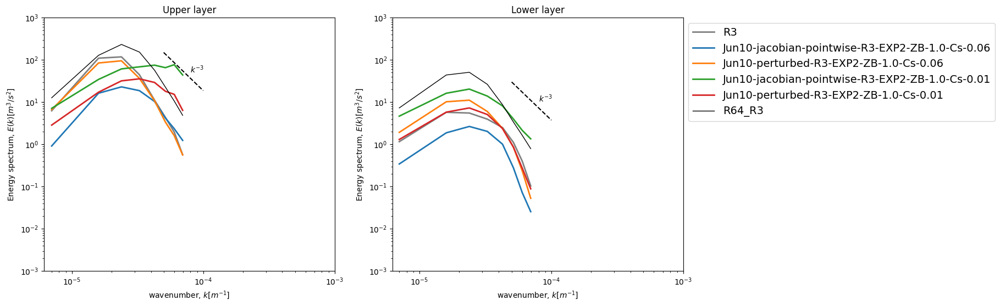

In [60]:
ds.plot_KE_spectrum(['R3', 'Jun10-jacobian-pointwise-R3-EXP2-ZB-1.0-Cs-0.06', 'Jun10-perturbed-R3-EXP2-ZB-1.0-Cs-0.06', 'Jun10-jacobian-pointwise-R3-EXP2-ZB-1.0-Cs-0.01',
            'Jun10-perturbed-R3-EXP2-ZB-1.0-Cs-0.01',
            'R64_R3']);

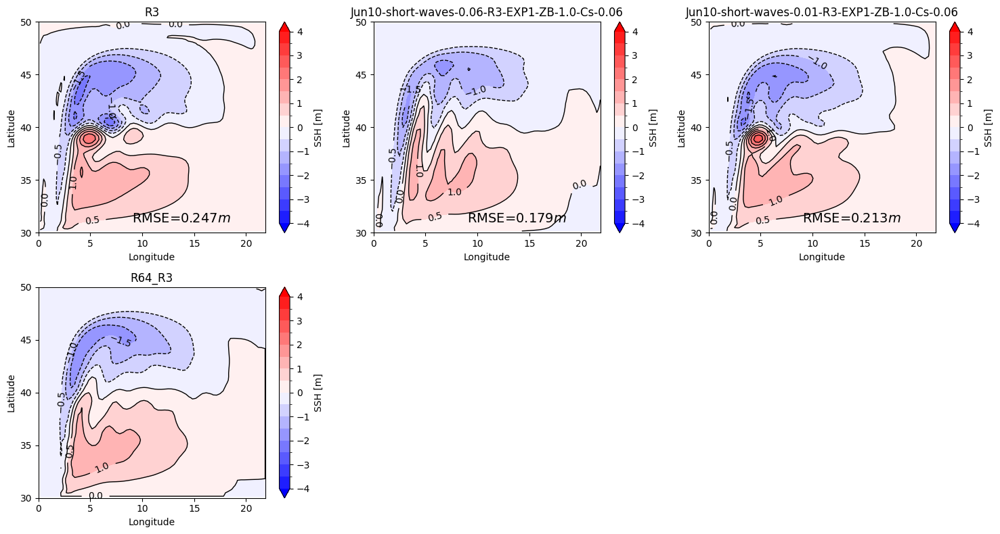

In [182]:
ds.plot_ssh(['R3', 'Jun10-short-waves-0.06-R3-EXP1-ZB-1.0-Cs-0.06', 'Jun10-short-waves-0.01-R3-EXP1-ZB-1.0-Cs-0.06', 'R64_R3'])

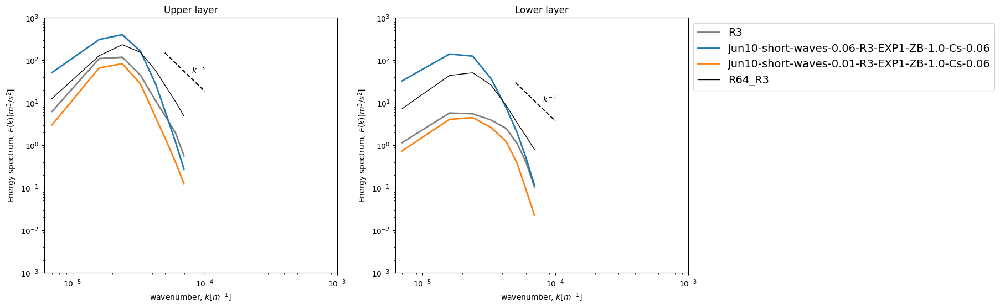

In [184]:
ds.plot_KE_spectrum(['R3', 'Jun10-short-waves-0.06-R3-EXP1-ZB-1.0-Cs-0.06', 'Jun10-short-waves-0.01-R3-EXP1-ZB-1.0-Cs-0.06', 'R64_R3'])

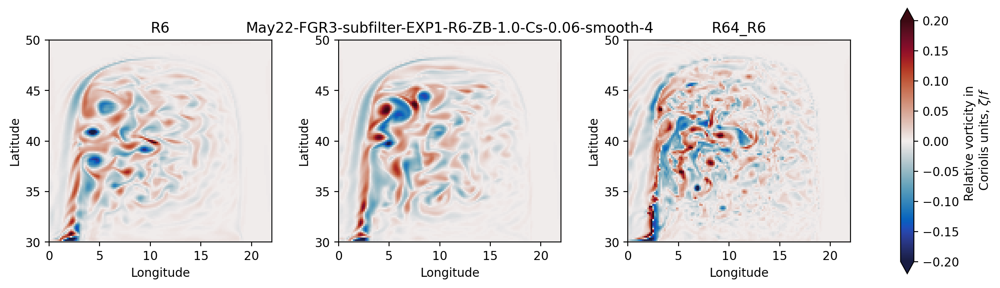

In [24]:
ds.plot_RV(['R6', 'May22-FGR3-subfilter-EXP1-R6-ZB-1.0-Cs-0.06-smooth-4','R64_R6'])

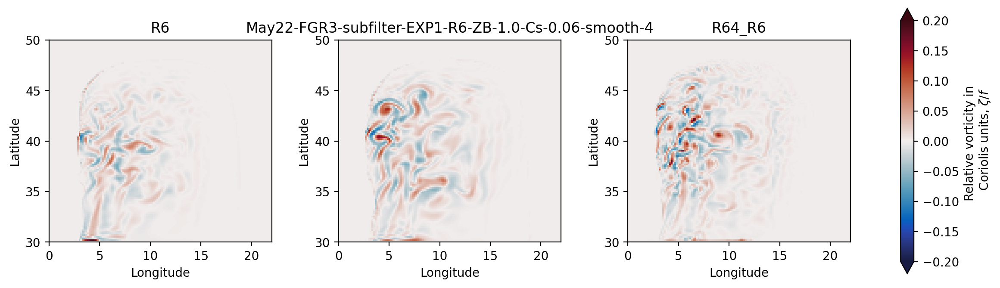

In [26]:
ds.plot_RV(['R6', 'May22-FGR3-subfilter-EXP1-R6-ZB-1.0-Cs-0.06-smooth-4','R64_R6'], zl=1)

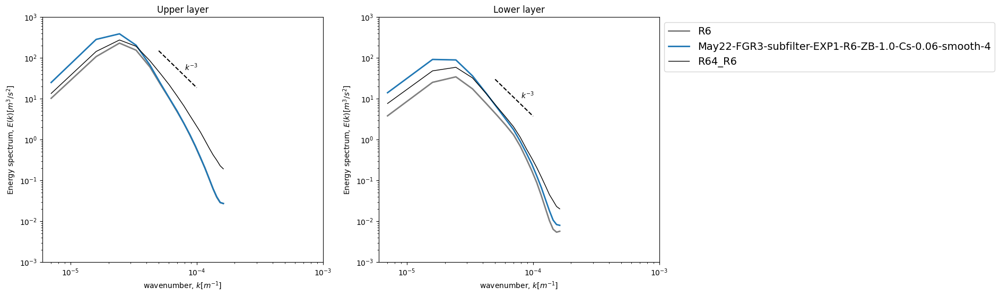

In [28]:
ds.plot_KE_spectrum(['R6', 'May22-FGR3-subfilter-EXP1-R6-ZB-1.0-Cs-0.06-smooth-4','R64_R6'])

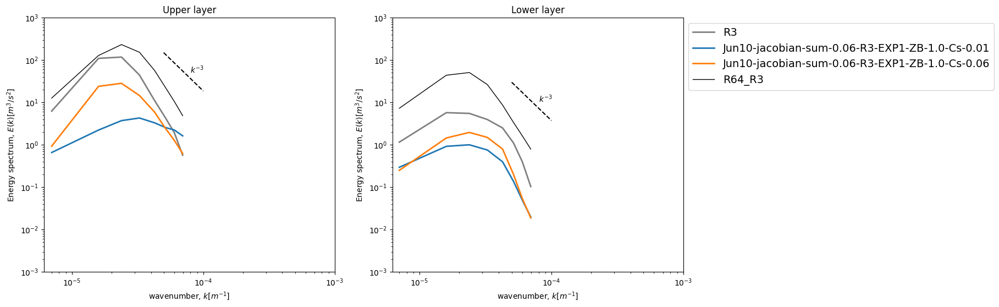

In [198]:
ds.plot_KE_spectrum(['R3', 'Jun10-jacobian-sum-0.06-R3-EXP1-ZB-1.0-Cs-0.01', 'Jun10-jacobian-sum-0.06-R3-EXP1-ZB-1.0-Cs-0.06', 'R64_R3'])

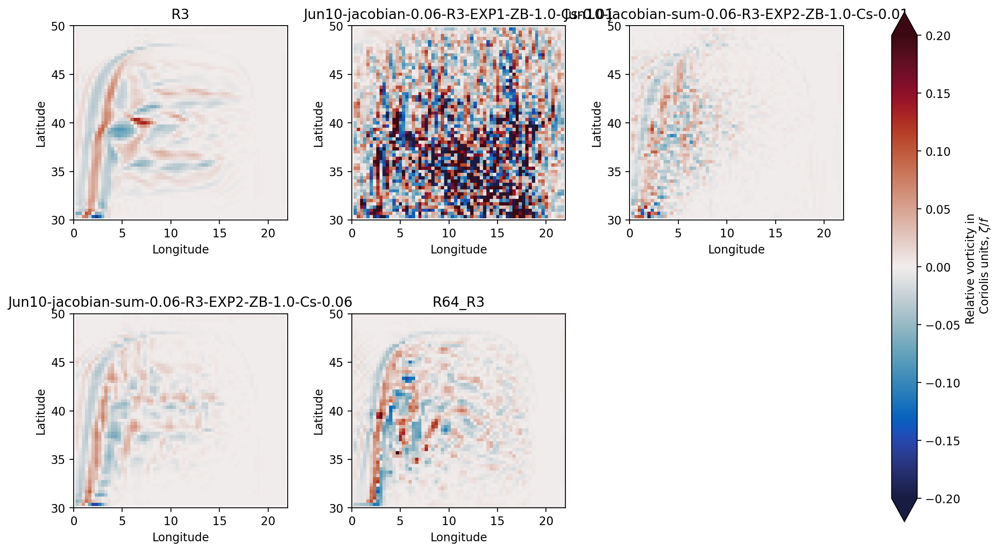

In [205]:
ds.plot_RV(['R3', 'Jun10-jacobian-0.06-R3-EXP1-ZB-1.0-Cs-0.01', 'Jun10-jacobian-sum-0.06-R3-EXP2-ZB-1.0-Cs-0.01','Jun10-jacobian-sum-0.06-R3-EXP2-ZB-1.0-Cs-0.06', 'R64_R3'], 
           idx=200)

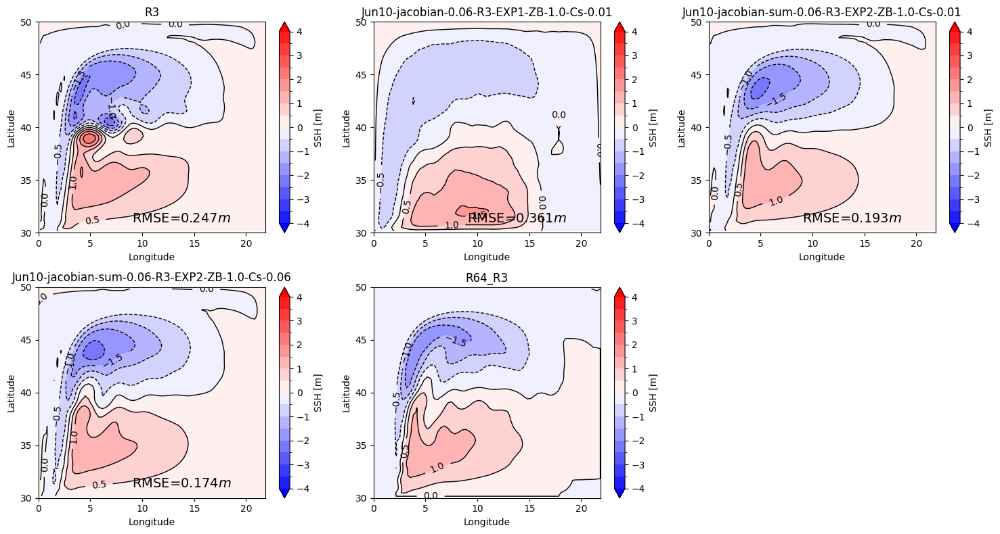

In [201]:
ds.plot_ssh(['R3', 'Jun10-jacobian-0.06-R3-EXP1-ZB-1.0-Cs-0.01', 'Jun10-jacobian-sum-0.06-R3-EXP2-ZB-1.0-Cs-0.01','Jun10-jacobian-sum-0.06-R3-EXP2-ZB-1.0-Cs-0.06', 'R64_R3'])

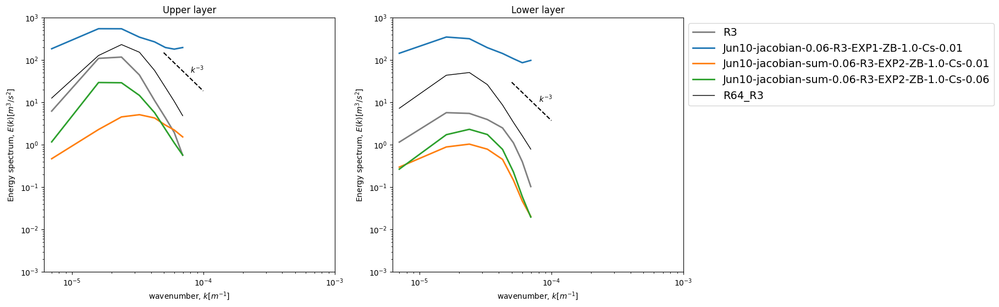

In [200]:
ds.plot_KE_spectrum(['R3', 'Jun10-jacobian-0.06-R3-EXP1-ZB-1.0-Cs-0.01', 'Jun10-jacobian-sum-0.06-R3-EXP2-ZB-1.0-Cs-0.01','Jun10-jacobian-sum-0.06-R3-EXP2-ZB-1.0-Cs-0.06', 'R64_R3'])

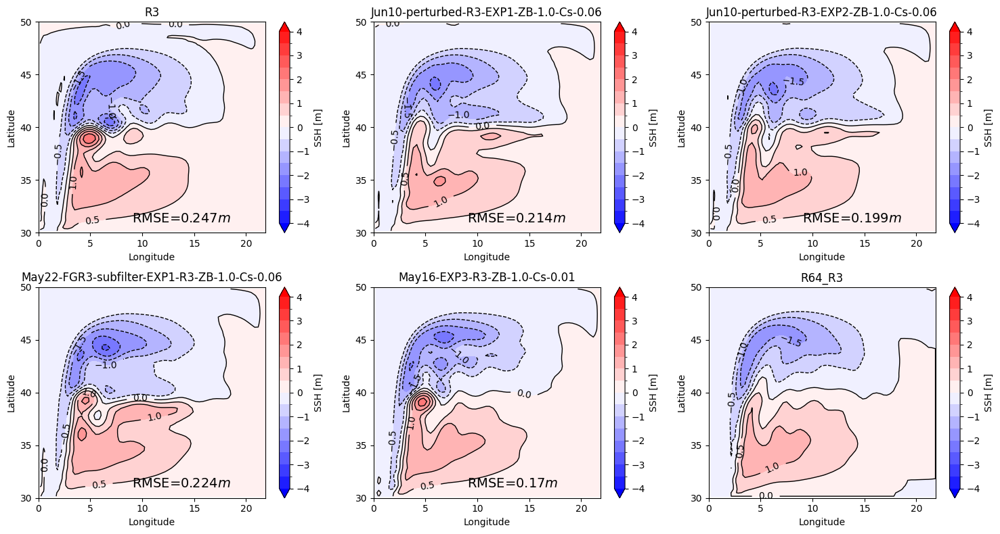

In [194]:
ds.plot_ssh(['R3', 'Jun10-perturbed-R3-EXP1-ZB-1.0-Cs-0.06', 
             'Jun10-perturbed-R3-EXP2-ZB-1.0-Cs-0.06', 
             'May22-FGR3-subfilter-EXP1-R3-ZB-1.0-Cs-0.06', 
             'May16-EXP3-R3-ZB-1.0-Cs-0.01', 
             'R64_R3'])

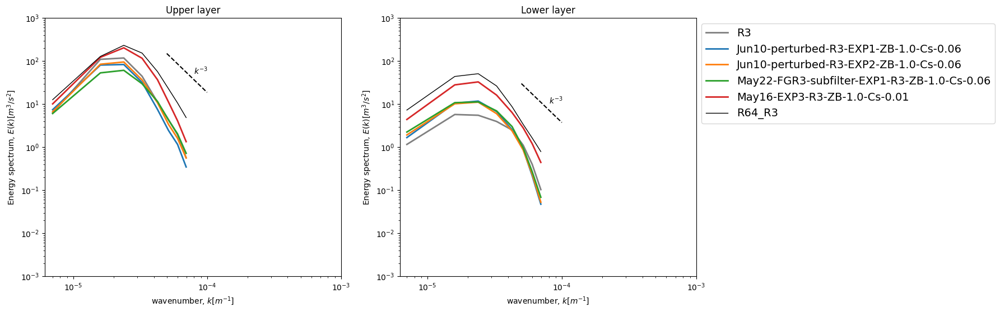

In [196]:
ds.plot_KE_spectrum(['R3', 'Jun10-perturbed-R3-EXP1-ZB-1.0-Cs-0.06', 
             'Jun10-perturbed-R3-EXP2-ZB-1.0-Cs-0.06', 
             'May22-FGR3-subfilter-EXP1-R3-ZB-1.0-Cs-0.06', 
             'May16-EXP3-R3-ZB-1.0-Cs-0.01', 
             'R64_R3'])

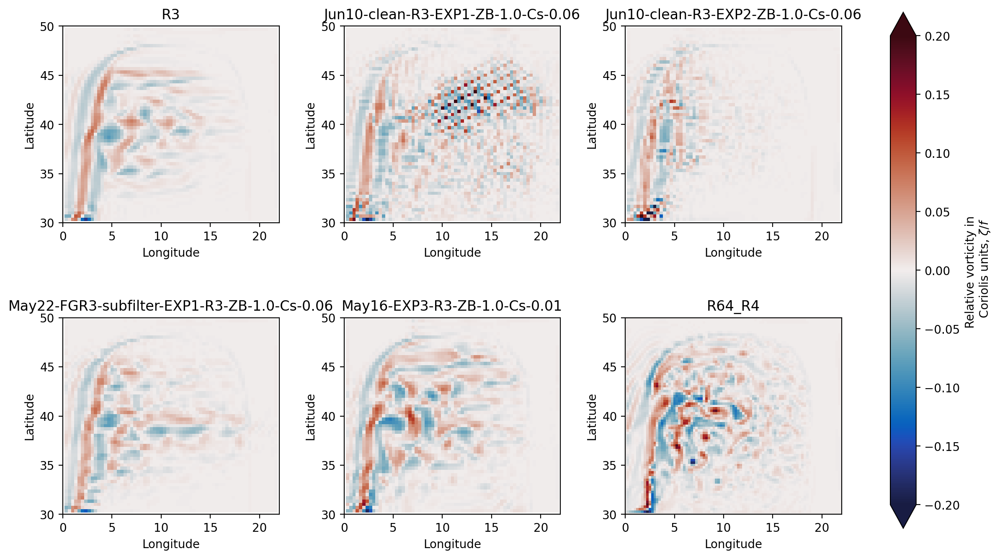

In [195]:
ds.plot_RV(['R3', 'Jun10-clean-R3-EXP1-ZB-1.0-Cs-0.06', 'Jun10-clean-R3-EXP2-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP1-R3-ZB-1.0-Cs-0.06', 
             'May16-EXP3-R3-ZB-1.0-Cs-0.01', 'R64_R4'], idx=-1)

# Generalization

In [10]:
def sample_ssh(exp, target):
    sample = []
    for year_start in [5, 10, 15]:
        try:
            year_end = year_start + 5
            idx = slice(365*year_start, 365*year_end)
            sample.append(
                Lk_error(ds[exp].ea.isel(zi=0).sel(Time=idx).mean('Time'), ds[target].ssh_mean)[0]
            )
        except:
            sample.append(np.nan)
    return xr.DataArray(sample, dims='sample')

In [11]:
def sample_KE(exp, target=None):
    sample = []
    for year_start in [5, 10, 15]:
        try:
            year_end = year_start + 5
            idx = slice(365*year_start, 365*year_end)
            u = ds[exp].u.sel(Time=idx)
            v = ds[exp].v.sel(Time=idx)
            h = ds[exp].h.sel(Time=idx)
    
            KE = 1e-15 * ds[exp].KE_joul(u, v, h).mean('Time').sum()
            sample.append(KE)
        except:
            sample.append(np.nan)
    return xr.DataArray(sample, dims='sample')

In [12]:
def sample_APE(exp, target=None):
    sample = []
    for year_start in [5, 10, 15]:
        try:
            year_end = year_start + 5
            idx = slice(365*year_start, 365*year_end)
            e = ds[exp].e.sel(Time=idx)
            APE = 1e-15 * (
                ds[exp].PE_joul(e).mean('Time').sum() + 
                ds[exp].PE_ssh(e).mean('Time').sum()
            )
            sample.append(APE)
        except:
            sample.append(np.nan)
    return xr.DataArray(sample, dims='sample')

In [13]:

def KE(exp, target=None):
    return 1e-15 * (ds[exp].MKE_joul + ds[exp].EKE_joul).sum('zl').values

def APE(exp, target=None):
    return 1e-15 * (ds[exp].MPE_joul + ds[exp].EPE_joul + ds[exp].MPE_ssh + ds[exp].EPE_ssh).values

# New plotter of APE/KE metrics

In [9]:
error = {}

In [14]:
%%time
for fun, fun_str in zip([sample_KE, sample_APE, sample_ssh], ['KE', 'APE', 'ssh']):
    error[f'bare-{fun_str}'] = xr.concat([fun(conf,f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')
    #error[f'bare-en-diss-{fun_str}'] = xr.concat([fun(f'{conf}-en-diss',f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')
    error[f'ZB-Smooth-{fun_str}'] = xr.concat([fun(f'ZB-Smooth-{conf}-ZB-1.0', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')
    #error[f'Jansen-Held-{fun_str}'] = xr.concat([fun(f'Jansen-Held-{conf}-ref', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')

CPU times: user 46.7 s, sys: 4.61 s, total: 51.3 s
Wall time: 48.2 s


In [84]:
%%time
for fun, fun_str in zip([sample_KE, sample_APE, sample_ssh], ['KE', 'APE', 'ssh']):
    error[f'ZB-Reynolds-{fun_str}'] = xr.concat([fun(f'ZB-Reynolds-{conf}-ZB-2.0', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')

CPU times: user 18.8 s, sys: 2.28 s, total: 21.1 s
Wall time: 18.1 s


In [17]:
%%time
for fun, fun_str in zip([sample_KE, sample_APE, sample_ssh], ['KE', 'APE', 'ssh']):
    error[f'ANN-Nov-{fun_str}'] = xr.concat([fun(f'ANN_CM26_grid_harmonic_ver3-{conf}-ZB-1.0-Cs-0.0', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')
    error[f'ANN-FCT-Mar-{fun_str}'] = xr.concat([fun(f'ANN_CM26_grid_harmonic_ver3-{conf}-ZB-1.0-FCT-3', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')    

CPU times: user 38.3 s, sys: 6.02 s, total: 44.4 s
Wall time: 29.5 s


In [18]:
%%time
for fun, fun_str in zip([sample_KE, sample_APE, sample_ssh], ['KE', 'APE', 'ssh']):
    %time error[f'ANN-Nov-{fun_str}'] = xr.concat([fun(f'ANN_CM26_grid_harmonic_ver3-{conf}-ZB-1.0-Cs-0.0', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')
    %time error[f'ANN-FCT-Mar-{fun_str}'] = xr.concat([fun(f'ANN_CM26_grid_harmonic_ver3-{conf}-ZB-1.0-FCT-3', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')    
    %time error[f'ANN-smag-Mar-{fun_str}'] = xr.concat([fun(f'ANN_CM26_grid_harmonic_ver3-{conf}-ZB-1.0-Cs-0.06', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')

CPU times: user 12.2 s, sys: 1.18 s, total: 13.3 s
Wall time: 13.9 s
CPU times: user 12 s, sys: 1.03 s, total: 13 s
Wall time: 13.2 s
CPU times: user 13.7 s, sys: 1.72 s, total: 15.4 s
Wall time: 15.5 s
CPU times: user 3.35 s, sys: 482 ms, total: 3.83 s
Wall time: 9.92 s
CPU times: user 3.33 s, sys: 481 ms, total: 3.81 s
Wall time: 8.22 s
CPU times: user 3.36 s, sys: 475 ms, total: 3.84 s
Wall time: 8.87 s
CPU times: user 987 ms, sys: 218 ms, total: 1.21 s
Wall time: 6.9 s
CPU times: user 1.52 s, sys: 229 ms, total: 1.75 s
Wall time: 7.22 s
CPU times: user 2.59 s, sys: 814 ms, total: 3.41 s
Wall time: 2.88 s
CPU times: user 53 s, sys: 6.63 s, total: 59.6 s
Wall time: 1min 26s


In [14]:
%%time
for fun, fun_str in zip([sample_KE, sample_APE, sample_ssh], ['KE', 'APE', 'ssh']):
    #for postfix in ['inviscid', 'FCT-0', 'FCT-0-Cs-0.00', 'FCT-0-Cs-0.01', 'FCT-0-Cs-0.03', 'FCT-3', 'FCT-3-low', 'FCT-3-medium', 'FCT-3-small', 'Cs-0.06', 'Cs-0.03', 'Cs-0.01', 'Cs-0.00', 'Cs-0.01-en-diss', 'Cs-0.00-en-diss']:
    for postfix in ['Cs-0.01']:
        for exp in ['EXP2', 'EXP3']:
            %time error[f'{exp}-{postfix}-{fun_str}'] = xr.concat([fun(f'May16-{exp}-{conf}-ZB-1.0-{postfix}', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')

CPU times: user 12.9 s, sys: 1.53 s, total: 14.5 s
Wall time: 8.77 s
CPU times: user 12.9 s, sys: 1.63 s, total: 14.6 s
Wall time: 8.87 s
CPU times: user 3.11 s, sys: 416 ms, total: 3.52 s
Wall time: 2.57 s
CPU times: user 3.14 s, sys: 398 ms, total: 3.54 s
Wall time: 2.59 s
CPU times: user 2.69 s, sys: 749 ms, total: 3.44 s
Wall time: 2.96 s
CPU times: user 2.32 s, sys: 695 ms, total: 3.02 s
Wall time: 2.49 s
CPU times: user 37.1 s, sys: 5.42 s, total: 42.5 s
Wall time: 28.3 s


In [44]:
%%time
for fun, fun_str in zip([sample_KE, sample_APE, sample_ssh], ['KE', 'APE', 'ssh']):
    for postfix in ['Cs-0.01', 'Cs-0.03']:
        for exp in ['EXP2', 'EXP3']:
            %time error[f'{exp}-{postfix}-{fun_str}'] = xr.concat([fun(f'May16-{exp}-{conf}-ZB-1.0-{postfix}', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')

CPU times: user 12.4 s, sys: 1.21 s, total: 13.6 s
Wall time: 12.1 s
CPU times: user 11.9 s, sys: 1.2 s, total: 13.1 s
Wall time: 10.7 s
CPU times: user 11.6 s, sys: 974 ms, total: 12.6 s
Wall time: 12.7 s
CPU times: user 12.1 s, sys: 1.15 s, total: 13.2 s
Wall time: 12.9 s
CPU times: user 3.18 s, sys: 436 ms, total: 3.61 s
Wall time: 3.26 s
CPU times: user 3.19 s, sys: 419 ms, total: 3.61 s
Wall time: 3.15 s
CPU times: user 3.18 s, sys: 419 ms, total: 3.6 s
Wall time: 3.19 s
CPU times: user 3.18 s, sys: 422 ms, total: 3.6 s
Wall time: 3.17 s
CPU times: user 2.27 s, sys: 574 ms, total: 2.84 s
Wall time: 2.77 s
CPU times: user 2.77 s, sys: 622 ms, total: 3.39 s
Wall time: 3.42 s
CPU times: user 1.68 s, sys: 359 ms, total: 2.04 s
Wall time: 4.87 s
CPU times: user 2.27 s, sys: 591 ms, total: 2.86 s
Wall time: 2.78 s
CPU times: user 1min 9s, sys: 8.38 s, total: 1min 18s
Wall time: 1min 15s


In [45]:
%%time
for fun, fun_str in zip([sample_KE, sample_APE, sample_ssh], ['KE', 'APE', 'ssh']):
    for postfix in ['Cs-0.01', 'Cs-0.03']:
        for exp in ['EXP1', 'EXP2']:
            %time error[f'Jun13-{exp}-{postfix}-{fun_str}'] = xr.concat([fun(f'Jun13-white-noise-{conf}-EXP2-ZB-1.0-{postfix}', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')

CPU times: user 13.4 s, sys: 1.49 s, total: 14.9 s
Wall time: 9.82 s
CPU times: user 11.4 s, sys: 986 ms, total: 12.4 s
Wall time: 6.76 s
CPU times: user 12.6 s, sys: 1.31 s, total: 13.9 s
Wall time: 9.1 s
CPU times: user 11.9 s, sys: 1 s, total: 12.9 s
Wall time: 7.34 s
CPU times: user 3.41 s, sys: 467 ms, total: 3.88 s
Wall time: 2.82 s
CPU times: user 3.1 s, sys: 337 ms, total: 3.44 s
Wall time: 2.44 s
CPU times: user 3.2 s, sys: 399 ms, total: 3.6 s
Wall time: 2.6 s
CPU times: user 3 s, sys: 310 ms, total: 3.31 s
Wall time: 2.36 s
CPU times: user 2.25 s, sys: 520 ms, total: 2.77 s
Wall time: 2.64 s
CPU times: user 777 ms, sys: 93.2 ms, total: 871 ms
Wall time: 718 ms
CPU times: user 2.9 s, sys: 638 ms, total: 3.53 s
Wall time: 3.4 s
CPU times: user 782 ms, sys: 94.3 ms, total: 877 ms
Wall time: 724 ms
CPU times: user 1min 8s, sys: 7.66 s, total: 1min 16s
Wall time: 50.7 s


In [15]:
%%time
for fun, fun_str in zip([sample_KE, sample_APE, sample_ssh], ['KE', 'APE', 'ssh']):
    for postfix in ['Cs-0.01', 'Cs-0.06']:
        for exp in ['EXP1', 'EXP2']:
            %time error[f'Jun12-{exp}-{postfix}-{fun_str}'] = xr.concat([fun(f'Jun12-SFS-FGR2-short-waves-{conf}-{exp}-ZB-1.0-{postfix}', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')

CPU times: user 12.9 s, sys: 1.46 s, total: 14.4 s
Wall time: 8.8 s
CPU times: user 12.5 s, sys: 1.45 s, total: 14 s
Wall time: 8.36 s
CPU times: user 13 s, sys: 1.5 s, total: 14.5 s
Wall time: 9.05 s
CPU times: user 12.5 s, sys: 1.45 s, total: 14 s
Wall time: 8.41 s
CPU times: user 3.13 s, sys: 422 ms, total: 3.55 s
Wall time: 2.85 s
CPU times: user 3.12 s, sys: 430 ms, total: 3.55 s
Wall time: 2.87 s
CPU times: user 3.61 s, sys: 420 ms, total: 4.03 s
Wall time: 3.13 s
CPU times: user 3.12 s, sys: 436 ms, total: 3.56 s
Wall time: 2.67 s
CPU times: user 2.35 s, sys: 694 ms, total: 3.05 s
Wall time: 2.53 s
CPU times: user 2.32 s, sys: 729 ms, total: 3.05 s
Wall time: 2.52 s
CPU times: user 2.84 s, sys: 770 ms, total: 3.61 s
Wall time: 3.06 s
CPU times: user 2.31 s, sys: 718 ms, total: 3.03 s
Wall time: 2.52 s
CPU times: user 1min 13s, sys: 10.5 s, total: 1min 24s
Wall time: 56.8 s


In [15]:
%%time
for fun, fun_str in zip([sample_KE, sample_APE, sample_ssh], ['KE', 'APE', 'ssh']):
    #for FGR in [1,2,3,4]:
    for FGR in [1,2,3,4]:
        #for postfix in ['Cs-0.01', 'Cs-0.03', 'Cs-0.06', 'Cs-0.01-smooth-1', 'Cs-0.03-smooth-1', 'Cs-0.06-smooth-1', 'Cs-0.01-smooth-4', 'Cs-0.03-smooth-4', 'Cs-0.06-smooth-4']:
        for postfix in ['Cs-0.06']:
            for exp in ['EXP1', 'EXP2']:
                %time error[f'May22-FGR{FGR}-{exp}-{postfix}-{fun_str}'] = xr.concat([fun(f'May22-FGR{FGR}-subfilter-{exp}-{conf}-ZB-1.0-{postfix}', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')


CPU times: user 15.2 s, sys: 1.33 s, total: 16.5 s
Wall time: 12.7 s
CPU times: user 15.7 s, sys: 1.47 s, total: 17.1 s
Wall time: 13.2 s
CPU times: user 15.5 s, sys: 1.41 s, total: 16.9 s
Wall time: 13 s
CPU times: user 15.3 s, sys: 1.4 s, total: 16.7 s
Wall time: 12.9 s
CPU times: user 16.1 s, sys: 1.44 s, total: 17.6 s
Wall time: 13.7 s
CPU times: user 15.6 s, sys: 1.48 s, total: 17.1 s
Wall time: 13 s
CPU times: user 15.3 s, sys: 1.47 s, total: 16.8 s
Wall time: 13 s
CPU times: user 15.1 s, sys: 1.45 s, total: 16.6 s
Wall time: 13 s
CPU times: user 6.25 s, sys: 510 ms, total: 6.76 s
Wall time: 10.2 s
CPU times: user 6.18 s, sys: 520 ms, total: 6.7 s
Wall time: 9.7 s
CPU times: user 5.58 s, sys: 449 ms, total: 6.03 s
Wall time: 9.42 s
CPU times: user 6.16 s, sys: 532 ms, total: 6.69 s
Wall time: 9.78 s
CPU times: user 5.5 s, sys: 427 ms, total: 5.93 s
Wall time: 9.24 s
CPU times: user 6.2 s, sys: 522 ms, total: 6.73 s
Wall time: 9.21 s
CPU times: user 6.21 s, sys: 490 ms, total: 6.7

In [19]:
%%time
for fun, fun_str in zip([sample_KE, sample_APE, sample_ssh], ['KE', 'APE', 'ssh']):
    for postfix in ['Cs-0.01']:
        for exp in ['EXP2', 'EXP3']:
            %time error[f'May16-{exp}-{postfix}-{fun_str}'] = xr.concat([fun(f'May16-{exp}-{conf}-ZB-1.0-{postfix}', f'R64_{conf}') for conf in ['R2', 'R3', 'R4', 'R5', 'R6', 'R7', 'R8']], dim='res')

CPU times: user 11.3 s, sys: 987 ms, total: 12.3 s
Wall time: 11 s
CPU times: user 11.4 s, sys: 942 ms, total: 12.3 s
Wall time: 11 s
CPU times: user 3.18 s, sys: 410 ms, total: 3.59 s
Wall time: 3.06 s
CPU times: user 3.16 s, sys: 431 ms, total: 3.59 s
Wall time: 3.22 s
CPU times: user 946 ms, sys: 168 ms, total: 1.11 s
Wall time: 4.79 s
CPU times: user 921 ms, sys: 185 ms, total: 1.11 s
Wall time: 4.67 s
CPU times: user 30.9 s, sys: 3.12 s, total: 34 s
Wall time: 37.8 s


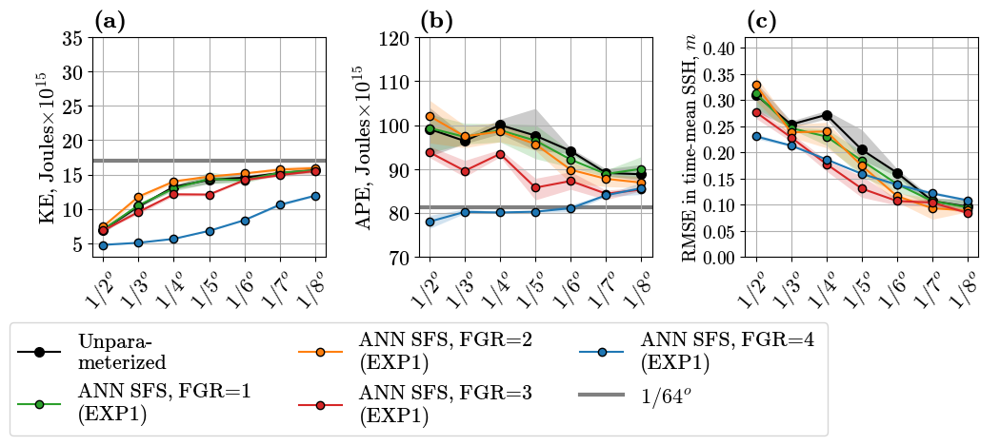

In [27]:
default_rcParams({'font.size': 16, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
plt.figure(figsize=(12,3))

yellow = [0.9290, 0.6940, 0.1250]
violet = [0.4940, 0.1840, 0.5560]
lightblue = [0.3010, 0.7450, 0.9330]

for row, fun_str in enumerate(['KE', 'APE', 'ssh']):
    plt.subplot(1,3,row+1)

    def plot_markers_with_filling(model='Jansen-Held', color='tab:red', marker='s', label=None, markersize=None, lw=None):
        error[model].mean('sample').plot(color=color, marker=marker, label=label, markersize=markersize, markeredgecolor='k', lw=lw)
        plt.fill_between(range(7), error[model].min('sample'), error[model].max('sample'), color=color, alpha=0.2, lw=0)
    
    plot_markers_with_filling(f'bare-{fun_str}', 'k', 'o', 'Unpara-\nmeterized', 7)
    #plot_markers_with_filling(f'bare-en-diss-{fun_str}', 'gray', 'd', 'Unpara-\nmeterized (EN_DIS)', 6)
    #plot_markers_with_filling(f'ZB-Smooth-{fun_str}', yellow, 'o', 'ZB20-Smooth', 6)
    #plot_markers_with_filling(f'ZB-Reynolds-{fun_str}', violet, 'o', 'ZB20-Reynolds', 6)
    #plot_markers_with_filling(f'Jansen-Held-{fun_str}', 'tab:olive', 'o', 'JHAH15', 6)
    #plot_markers_with_filling(f'EXP2-inviscid-{fun_str}', yellow, 'd', 'ANN-inviscid', 6)
    #plot_markers_with_filling(f'EXP3-inviscid-{fun_str}', yellow, 'd', 'ANN-inviscid', 6)

    #plot_markers_with_filling(f'EXP2-FCT-0-{fun_str}', 'tab:red', 'd', 'ANN-FCT-0', 6)
    #plot_markers_with_filling(f'EXP3-FCT-0-{fun_str}', 'tab:red', 'd', 'ANN-FCT-0', 6)

    #plot_markers_with_filling(f'EXP2-FCT-0-Cs-0.01-{fun_str}', 'tab:orange', 'd', 'ANN-FCT-0-Cs-0.01', 6)
    #plot_markers_with_filling(f'EXP3-FCT-0-Cs-0.01-{fun_str}', 'tab:orange', 'd', 'ANN-FCT-0-Cs-0.01', 6)

    #plot_markers_with_filling(f'EXP3-FCT-0-Cs-0.03-{fun_str}', 'tab:cyan', 'd', 'ANN-FCT-0-Cs-0.03', 6)

    #plot_markers_with_filling(f'EXP2-Cs-0.00-{fun_str}', 'tab:pink', 'd', 'ANN-Cs-0.00', 6)
    #plot_markers_with_filling(f'EXP3-Cs-0.00-{fun_str}', 'tab:blue', 'p', 'ANN-Cs-0.00', 7)
    #plot_markers_with_filling(f'EXP3-Cs-0.00-en-diss-{fun_str}', 'tab:blue', 'd', 'ANN-Cs-0.00 (EN_DIS)', 7)

    #plot_markers_with_filling(f'May16-EXP2-Cs-0.01-{fun_str}', 'tab:orange', 's', 'May16-ANN-Cs-0.01', 6)
    #plot_markers_with_filling(f'May16-EXP3-Cs-0.01-{fun_str}', 'tab:orange', 'd', 'ANN from global run', 6)

    # plot_markers_with_filling(f'May22-FGR4-EXP1-Cs-0.06-smooth-4-{fun_str}', 'tab:green', 's', 'May22-FGR4-Cs-0.06-smooth-4', 6)
    # plot_markers_with_filling(f'May22-FGR4-EXP2-Cs-0.06-smooth-4-{fun_str}', 'tab:green', 'd', 'May22-FGR4-Cs-0.06-smooth-4', 6)

    #plot_markers_with_filling(f'May22-FGR3-EXP1-Cs-0.06-smooth-4-{fun_str}', 'tab:blue', 's', 'May22-FGR3-Cs-0.06-smooth-4', 6)
    #plot_markers_with_filling(f'May22-FGR3-EXP2-Cs-0.06-smooth-4-{fun_str}', 'tab:blue', 'd', 'May22-FGR3-Cs-0.06-smooth-4', 6)

    #plot_markers_with_filling(f'May22-FGR2-EXP1-Cs-0.06-{fun_str}', 'tab:red', 's', 'May22-FGR2-Cs-0.06', 6)
    #plot_markers_with_filling(f'May22-FGR2-EXP2-Cs-0.06-{fun_str}', 'tab:red', 'd', 'May22-FGR2-Cs-0.06', 6)

    #plot_markers_with_filling(f'May22-FGR1-EXP1-Cs-0.06-{fun_str}', 'tab:green', 's', 'ANN SFS, FGR=3 \n(EXP1)', 6)
    #plot_markers_with_filling(f'May22-FGR1-EXP2-Cs-0.06-{fun_str}', 'tab:red', 'o', 'ANN SFS, FGR=3 \n(EXP2)', 6)

    plot_markers_with_filling(f'May22-FGR1-EXP1-Cs-0.06-{fun_str}', 'tab:green', 'o', 'ANN SFS, FGR=1 \n(EXP1)', 6)
    plot_markers_with_filling(f'May22-FGR2-EXP1-Cs-0.06-{fun_str}', 'tab:orange', 'o', 'ANN SFS, FGR=2 \n(EXP1)', 6)
    plot_markers_with_filling(f'May22-FGR3-EXP1-Cs-0.06-{fun_str}', 'tab:red', 'o', 'ANN SFS, FGR=3 \n(EXP1)', 6)
    plot_markers_with_filling(f'May22-FGR4-EXP1-Cs-0.06-{fun_str}', 'tab:blue', 'o', 'ANN SFS, FGR=4 \n(EXP1)', 6)
    #plot_markers_with_filling(f'May22-FGR4-EXP2-Cs-0.06-{fun_str}', 'tab:red', 'o', 'ANN SFS, FGR=4 \n(EXP2)', 6)
    #plot_markers_with_filling(f'May22-FGR3-EXP2-Cs-0.06-{fun_str}', 'tab:green', 'd', 'May22-FGR3-Cs-0.06', 6)

    # plot_markers_with_filling(f'May22-FGR1-EXP1-Cs-0.06-smooth-4-{fun_str}', 'tab:red', 's', 'May22-FGR1-Cs-0.06-smooth-4', 6)
    # plot_markers_with_filling(f'May22-FGR1-EXP2-Cs-0.06-smooth-4-{fun_str}', 'tab:red', 'd', 'May22-FGR1-Cs-0.06-smooth-4', 6)

    #plot_markers_with_filling(f'Jun13-EXP1-Cs-0.01-{fun_str}', 'tab:green', 's', 'Jun13-ANN-Cs-0.01', 6)
    #plot_markers_with_filling(f'Jun13-EXP2-Cs-0.01-{fun_str}', 'tab:green', 'd', 'Jun13-ANN-Cs-0.01', 6)

    #plot_markers_with_filling(f'Jun12-EXP1-Cs-0.06-{fun_str}', 'tab:red', 's', 'Jun12-ANN-EXP1-Cs-0.06', 6)
    #plot_markers_with_filling(f'Jun12-EXP2-Cs-0.06-{fun_str}', 'tab:red', 'd', 'Jun12-ANN-EXP2-Cs-0.06', 6)

    #plot_markers_with_filling(f'Jun12-EXP1-Cs-0.01-{fun_str}', 'tab:green', 's', 'Jun12-ANN-EXP1-Cs-0.01', 6)
    #plot_markers_with_filling(f'Jun12-EXP2-Cs-0.01-{fun_str}', 'tab:green', 'd', 'Jun12-ANN-EXP2-Cs-0.01', 6)
    
    #plot_markers_with_filling(f'EXP3-Cs-0.01-en-diss-{fun_str}', 'tab:orange', 'd', 'ANN-Cs-0.01 (EN_DIS)', 7)

    # plot_markers_with_filling(f'EXP2-Cs-0.03-{fun_str}', 'tab:red', 'd', 'ANN-Cs-0.03', 6)
    # plot_markers_with_filling(f'EXP3-Cs-0.03-{fun_str}', 'tab:red', 's', 'ANN-Cs-0.03', 6)

    # plot_markers_with_filling(f'EXP2-Cs-0.06-{fun_str}', 'tab:blue', 'd', 'ANN-Cs-0.06', 6)
    # plot_markers_with_filling(f'EXP3-Cs-0.06-{fun_str}', 'tab:blue', 's', 'ANN-Cs-0.06', 6)

    #plot_markers_with_filling(f'EXP2-FCT-0-Cs-0.00-{fun_str}', 'tab:cyan', 'd', 'ANN-FCT-0-Cs-0.00', 6)
    #plot_markers_with_filling(f'EXP3-FCT-0-Cs-0.00-{fun_str}', 'tab:green', 'o', 'ANN-FCT-0-Cs-0.00', 7)

    #plot_markers_with_filling(f'EXP2-FCT-3-{fun_str}', violet, 'd', 'ANN-FCT-3', 6)
    #plot_markers_with_filling(f'EXP3-FCT-3-{fun_str}', 'tab:red', 'd', 'ANN-FCT-3', 6)

    #plot_markers_with_filling(f'EXP2-FCT-3-medium-{fun_str}', 'tab:orange', 'd', 'ANN-FCT-3-medium', 6)
    #plot_markers_with_filling(f'EXP3-FCT-3-medium-{fun_str}', 'tab:orange', 'd', 'ANN-FCT-3-medium', 6)

    #plot_markers_with_filling(f'EXP2-FCT-3-small-{fun_str}', 'tab:pink', 'd', 'ANN-FCT-3-small', 6)
    # plot_markers_with_filling(f'EXP3-FCT-3-small-{fun_str}', 'tab:pink', 's', 'ANN-FCT-3-small', 6)

    #plot_markers_with_filling(f'EXP2-FCT-3-low-{fun_str}', 'tab:olive', 'd', 'ANN-FCT-3-low', 6)
    #plot_markers_with_filling(f'EXP3-FCT-3-low-{fun_str}', 'tab:olive', 's', 'ANN-FCT-3-low', 6)
    
    plt.xticks([0,1,2,3,4,5,6], ['$1/2^o$', '$1/3^o$', '$1/4^o$', '$1/5^o$', '$1/6^o$', '$1/7^o$', '$1/8^o$'],rotation=50)    
    plt.grid()
    plt.xlabel('')
    if fun_str == 'KE':
        yticks = np.arange(5,40,5)
        plt.ylabel('KE, Joules$\\times10^{15}$')
        plt.yticks(yticks)
        plt.ylim([3,35])
        plt.axhline(y=KE('R64'),color='gray', zorder=-1,lw=3)
        #plt.text(0.0, 17.5,'$1/64^o$', color='gray')
    if fun_str == 'APE':
        yticks = np.arange(70,130,10)
        plt.ylabel('APE, Joules$\\times10^{15}$')
        plt.yticks(yticks)
        plt.ylim([min(yticks), max(yticks)])
        plt.axhline(y=APE('R64'),color='gray',zorder=-1,lw=3)
    
    if fun_str == 'ssh':
        yticks = np.arange(0,0.45,0.05)
        plt.ylabel('RMSE in time-mean SSH, $m$', fontsize=14)
        plt.yticks(yticks, fontsize=14)
        plt.ylim([0,0.42])

plt.gcf().align_ylabels()
set_letters(fontsize=18,x=0.0,y=1.05)
plt.plot(np.nan,np.nan,'-',color='gray',lw=3,label='$1/64^o$')
plt.legend(ncol=3, bbox_to_anchor=(0.4,-0.25))


#plt.suptitle('Second realization of training algorithm', y=1.1)
plt.savefig('../figures/generalization/generalization-May22.pdf')

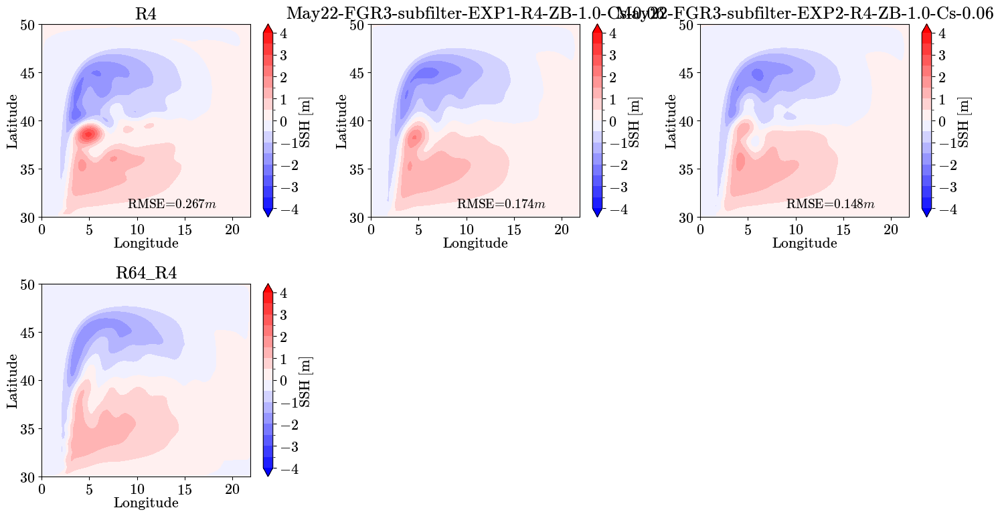

In [30]:
ds.plot_ssh(['R4', 'May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R4-ZB-1.0-Cs-0.06', 'R64_R4'])

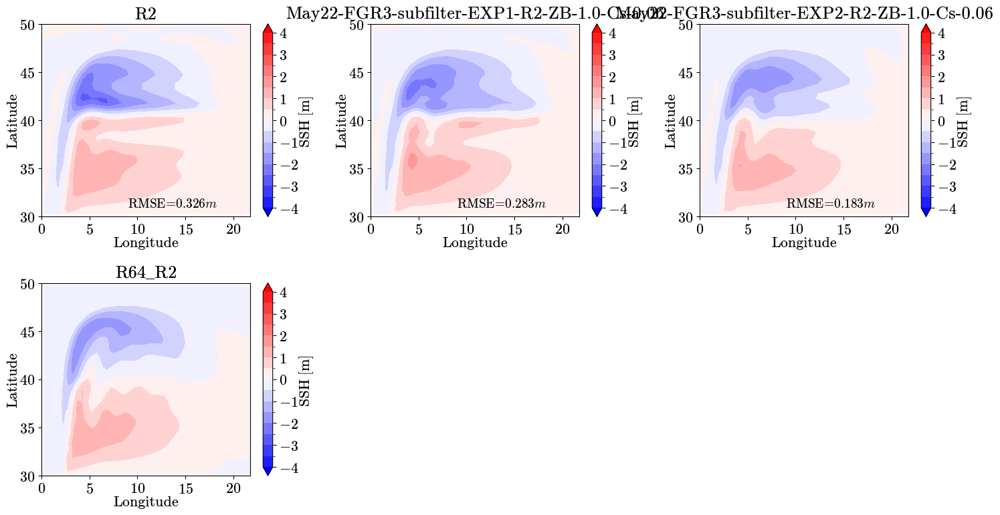

In [31]:
ds.plot_ssh(['R2', 'May22-FGR3-subfilter-EXP1-R2-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R2-ZB-1.0-Cs-0.06', 'R64_R2'])

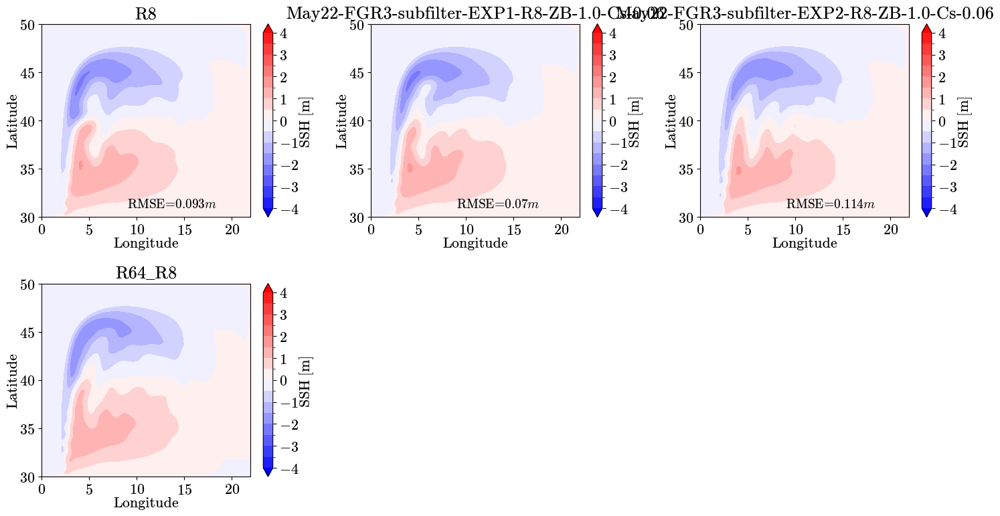

In [34]:
ds.plot_ssh(['R8', 'May22-FGR3-subfilter-EXP1-R8-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R8-ZB-1.0-Cs-0.06', 'R64_R8'])

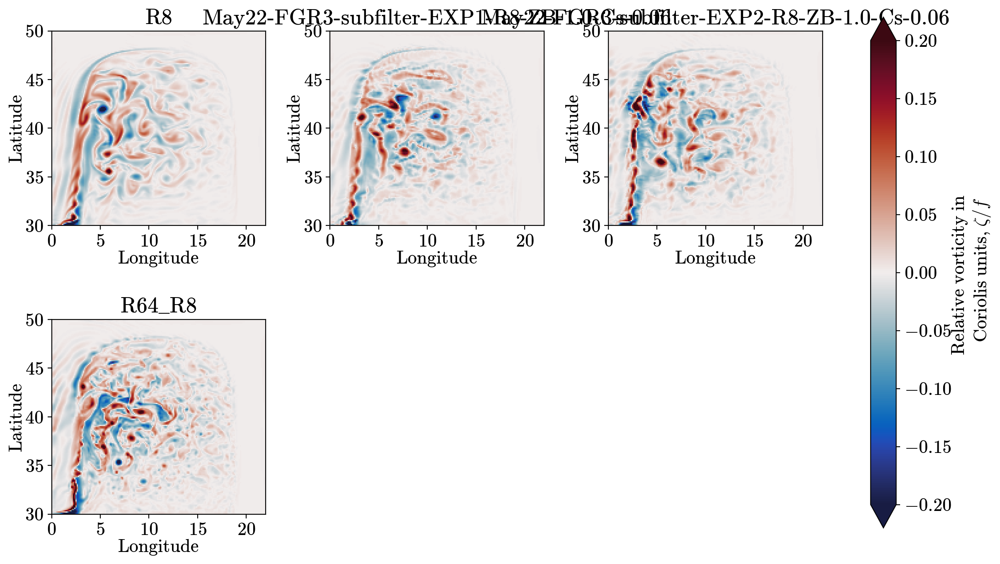

In [35]:
ds.plot_RV(['R8', 'May22-FGR3-subfilter-EXP1-R8-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R8-ZB-1.0-Cs-0.06', 'R64_R8'])

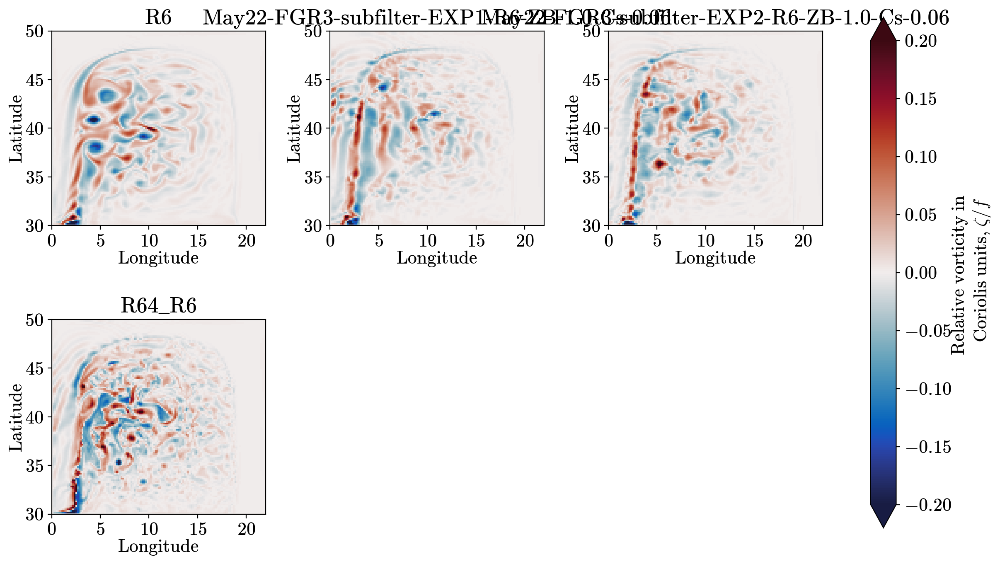

In [40]:
ds.plot_RV(['R6', 'May22-FGR3-subfilter-EXP1-R6-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R6-ZB-1.0-Cs-0.06', 'R64_R6'])

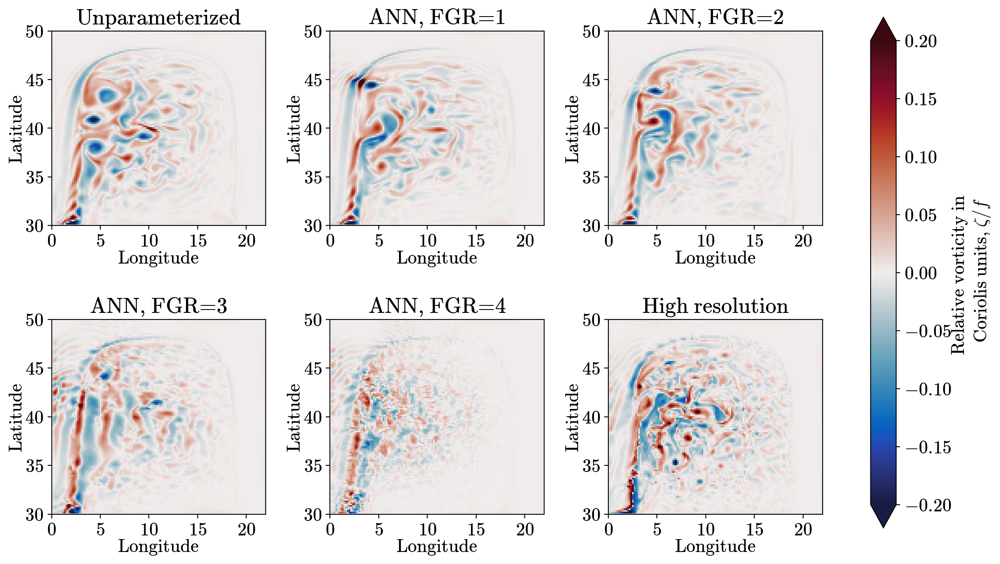

In [42]:
ds.plot_RV(['R6', 'May22-FGR1-subfilter-EXP1-R6-ZB-1.0-Cs-0.06', 'May22-FGR2-subfilter-EXP1-R6-ZB-1.0-Cs-0.06',
            'May22-FGR3-subfilter-EXP1-R6-ZB-1.0-Cs-0.06', 'May22-FGR4-subfilter-EXP1-R6-ZB-1.0-Cs-0.06',
            'R64_R6'],
          ['Unparameterized', 'ANN, FGR=1', 'ANN, FGR=2', 'ANN, FGR=3', 'ANN, FGR=4', 'High resolution'])

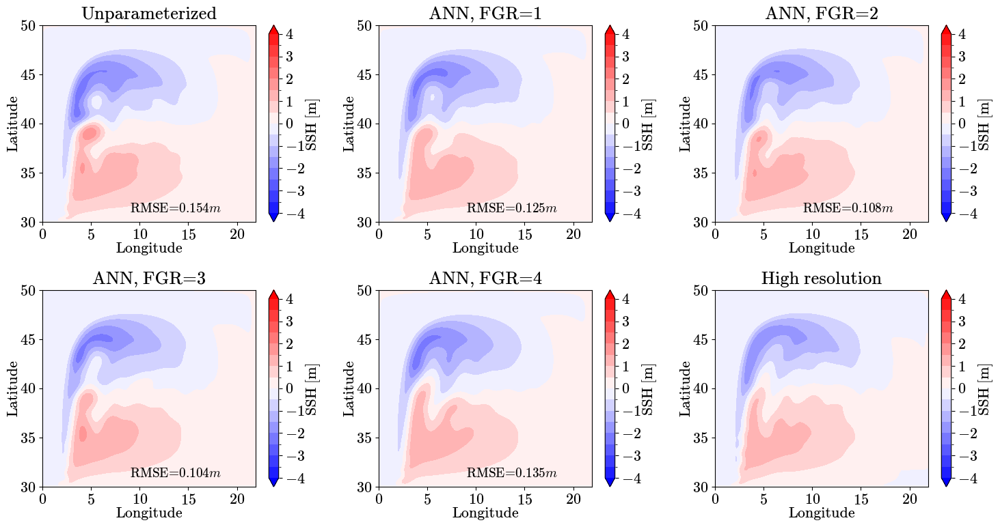

In [43]:
ds.plot_ssh(['R6', 'May22-FGR1-subfilter-EXP1-R6-ZB-1.0-Cs-0.06', 'May22-FGR2-subfilter-EXP1-R6-ZB-1.0-Cs-0.06',
            'May22-FGR3-subfilter-EXP1-R6-ZB-1.0-Cs-0.06', 'May22-FGR4-subfilter-EXP1-R6-ZB-1.0-Cs-0.06',
            'R64_R6'],
          ['Unparameterized', 'ANN, FGR=1', 'ANN, FGR=2', 'ANN, FGR=3', 'ANN, FGR=4', 'High resolution'])

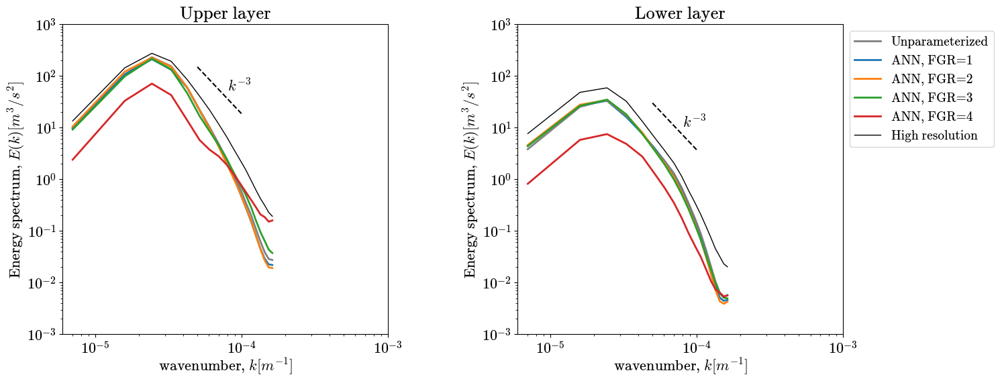

In [45]:
ds.plot_KE_spectrum(['R6', 'May22-FGR1-subfilter-EXP1-R6-ZB-1.0-Cs-0.06', 'May22-FGR2-subfilter-EXP1-R6-ZB-1.0-Cs-0.06',
            'May22-FGR3-subfilter-EXP1-R6-ZB-1.0-Cs-0.06', 'May22-FGR4-subfilter-EXP1-R6-ZB-1.0-Cs-0.06',
            'R64_R6'],
          ['Unparameterized', 'ANN, FGR=1', 'ANN, FGR=2', 'ANN, FGR=3', 'ANN, FGR=4', 'High resolution']);

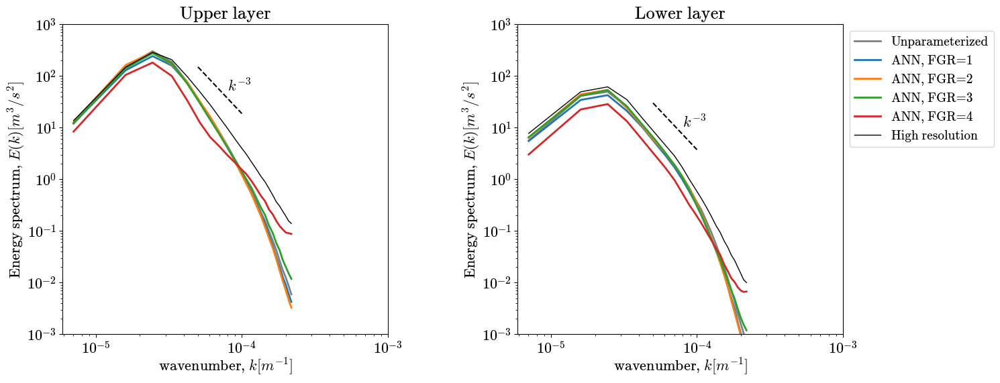

In [46]:
ds.plot_KE_spectrum(['R8', 'May22-FGR1-subfilter-EXP1-R8-ZB-1.0-Cs-0.06', 'May22-FGR2-subfilter-EXP1-R8-ZB-1.0-Cs-0.06',
            'May22-FGR3-subfilter-EXP1-R8-ZB-1.0-Cs-0.06', 'May22-FGR4-subfilter-EXP1-R8-ZB-1.0-Cs-0.06',
            'R64_R8'],
          ['Unparameterized', 'ANN, FGR=1', 'ANN, FGR=2', 'ANN, FGR=3', 'ANN, FGR=4', 'High resolution']);

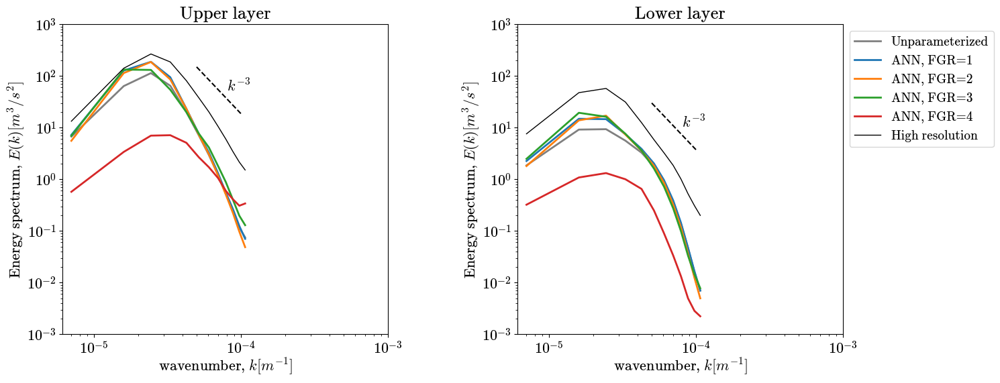

In [47]:
ds.plot_KE_spectrum(['R4', 'May22-FGR1-subfilter-EXP1-R4-ZB-1.0-Cs-0.06', 'May22-FGR2-subfilter-EXP1-R4-ZB-1.0-Cs-0.06',
            'May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06', 'May22-FGR4-subfilter-EXP1-R4-ZB-1.0-Cs-0.06',
            'R64_R4'],
          ['Unparameterized', 'ANN, FGR=1', 'ANN, FGR=2', 'ANN, FGR=3', 'ANN, FGR=4', 'High resolution']);

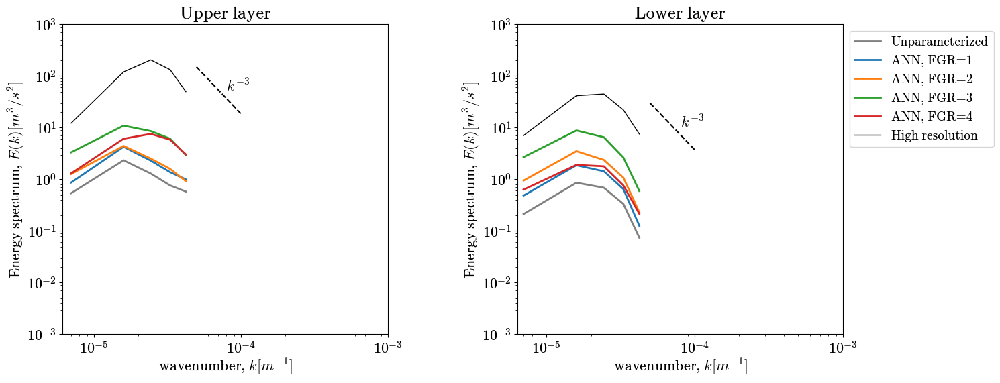

In [48]:
ds.plot_KE_spectrum(['R2', 'May22-FGR1-subfilter-EXP1-R2-ZB-1.0-Cs-0.06', 'May22-FGR2-subfilter-EXP1-R2-ZB-1.0-Cs-0.06',
            'May22-FGR3-subfilter-EXP1-R2-ZB-1.0-Cs-0.06', 'May22-FGR4-subfilter-EXP1-R2-ZB-1.0-Cs-0.06',
            'R64_R2'],
          ['Unparameterized', 'ANN, FGR=1', 'ANN, FGR=2', 'ANN, FGR=3', 'ANN, FGR=4', 'High resolution']);

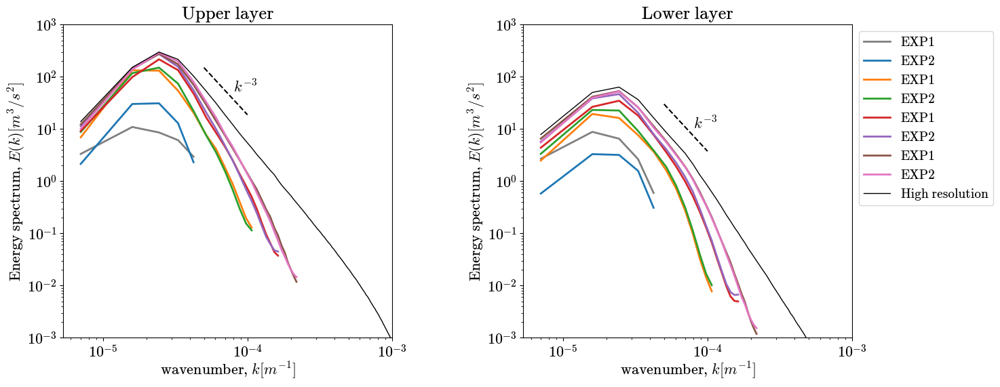

In [52]:
ds.plot_KE_spectrum(['May22-FGR3-subfilter-EXP1-R2-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R2-ZB-1.0-Cs-0.06', 
                     'May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R4-ZB-1.0-Cs-0.06',
                     'May22-FGR3-subfilter-EXP1-R6-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R6-ZB-1.0-Cs-0.06',
                     'May22-FGR3-subfilter-EXP1-R8-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R8-ZB-1.0-Cs-0.06',
                     'R64'],
                     ['EXP1', 'EXP2']*4 + ['High resolution']);

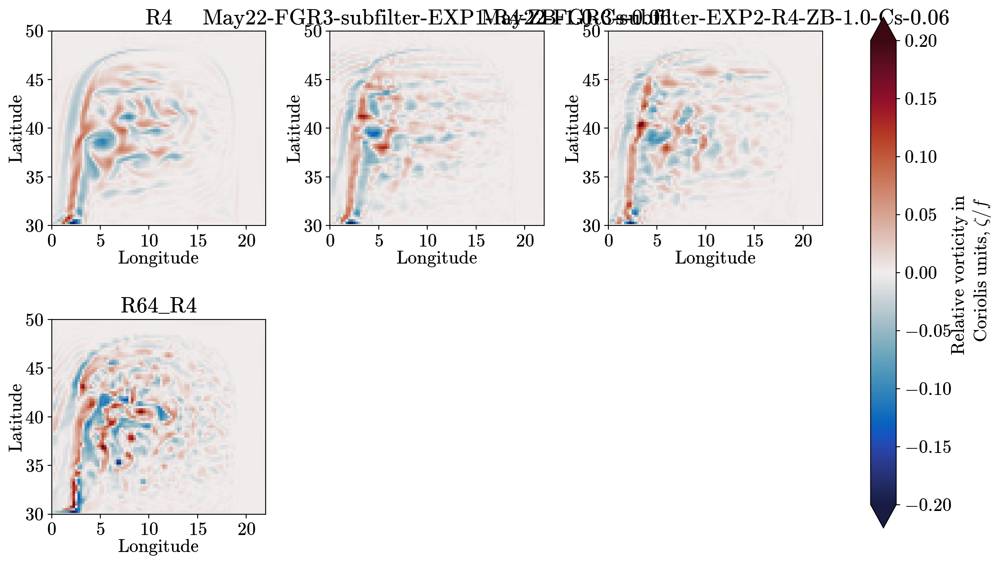

In [36]:
ds.plot_RV(['R4', 'May22-FGR3-subfilter-EXP1-R4-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R4-ZB-1.0-Cs-0.06', 'R64_R4'])

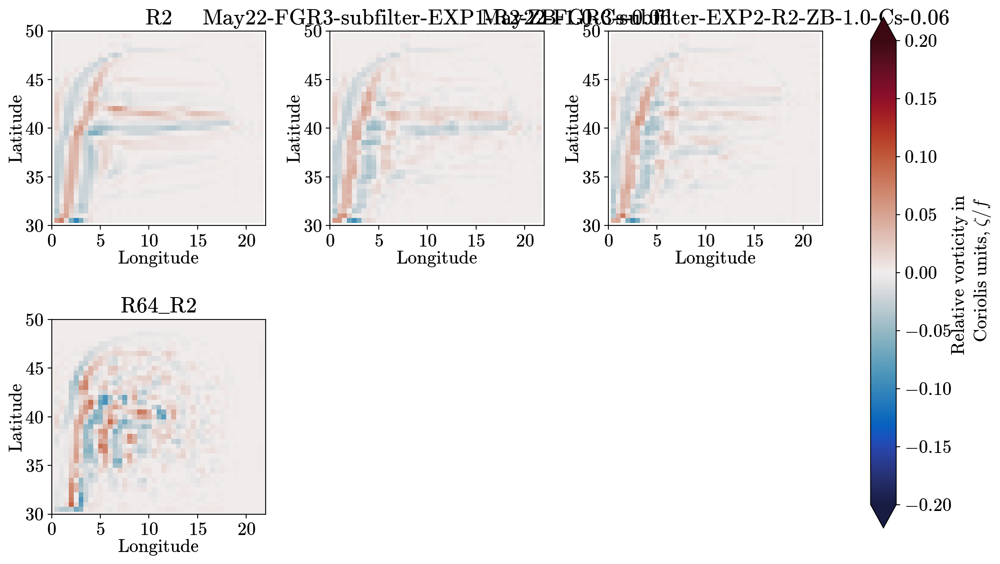

In [37]:
ds.plot_RV(['R2', 'May22-FGR3-subfilter-EXP1-R2-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R2-ZB-1.0-Cs-0.06', 'R64_R2'])

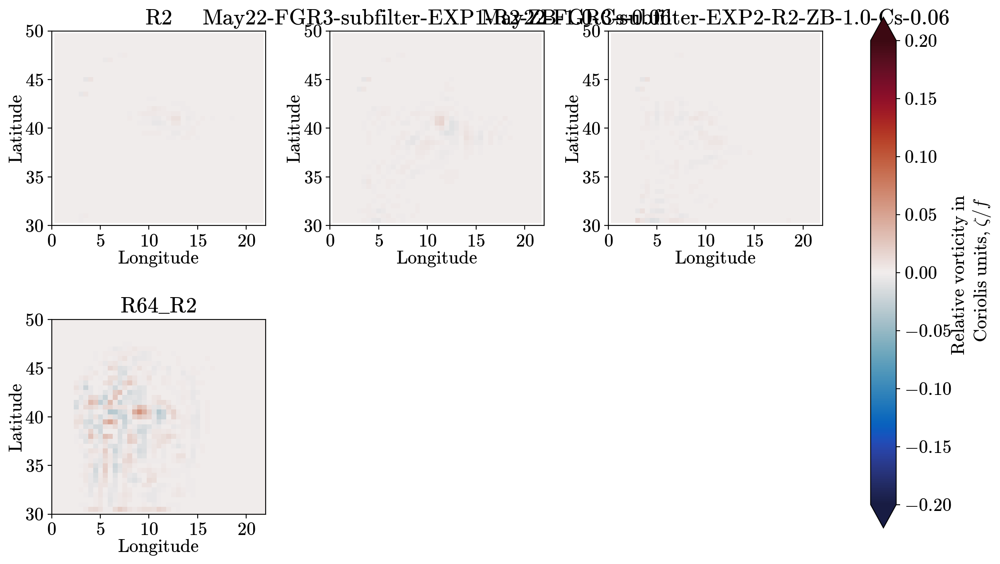

In [38]:
ds.plot_RV(['R2', 'May22-FGR3-subfilter-EXP1-R2-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R2-ZB-1.0-Cs-0.06', 'R64_R2'], zl=1)

In [39]:
ds.plot_KE(['R2', 'May22-FGR3-subfilter-EXP1-R2-ZB-1.0-Cs-0.06', 'May22-FGR3-subfilter-EXP2-R2-ZB-1.0-Cs-0.06', 'R64_R2'], zl=1)

AttributeError: 'CollectionOfExperiments' object has no attribute 'plot_KE'

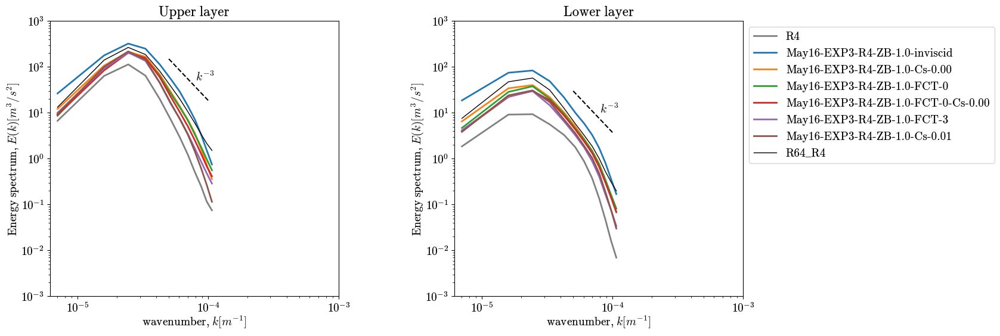

In [48]:
RR = 'R4'
default_rcParams({'font.size': 14, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_KE_spectrum([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

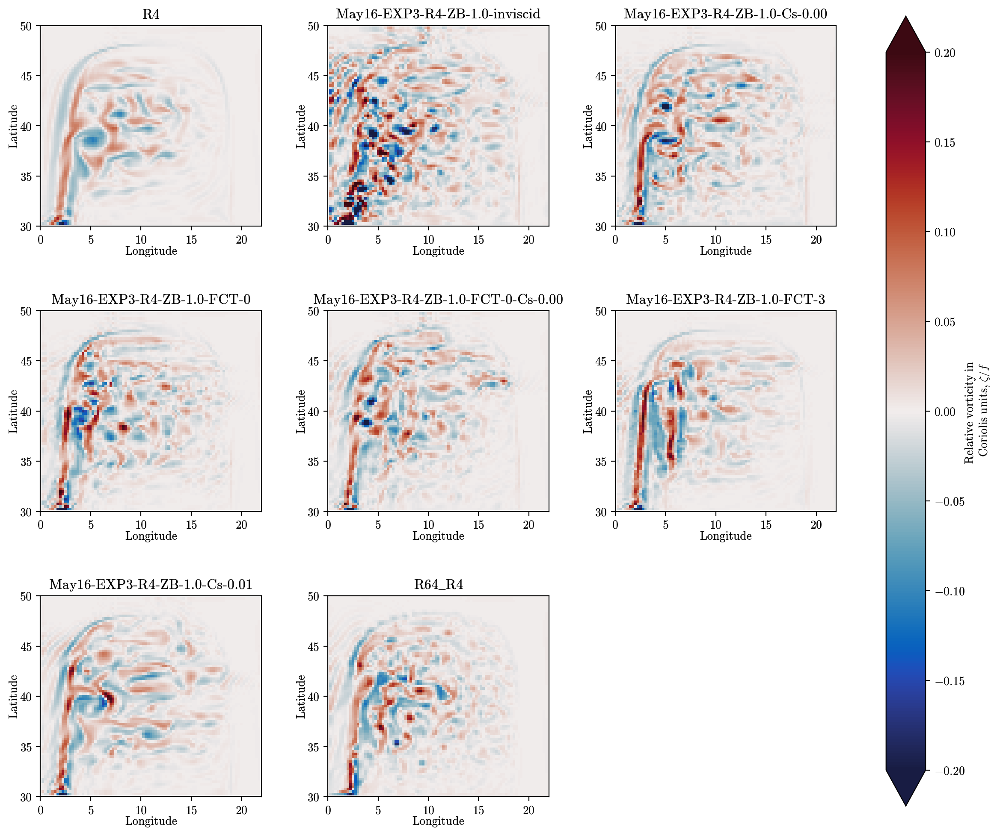

In [50]:
RR = 'R4'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_RV([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

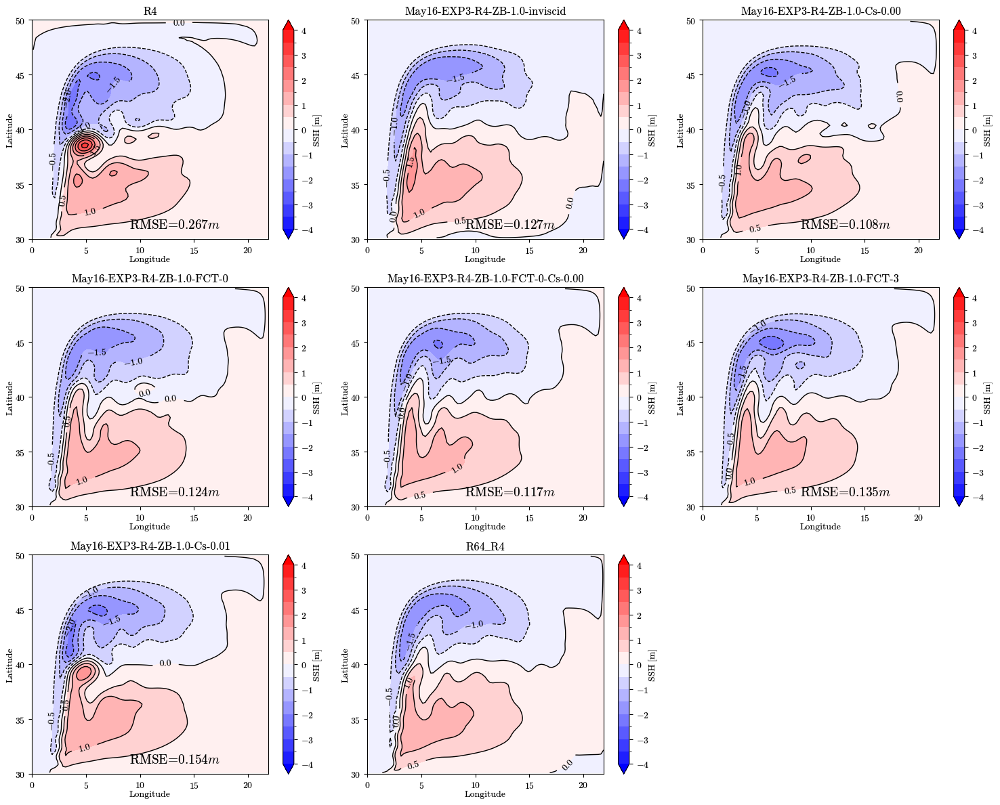

In [51]:
RR = 'R4'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_ssh([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

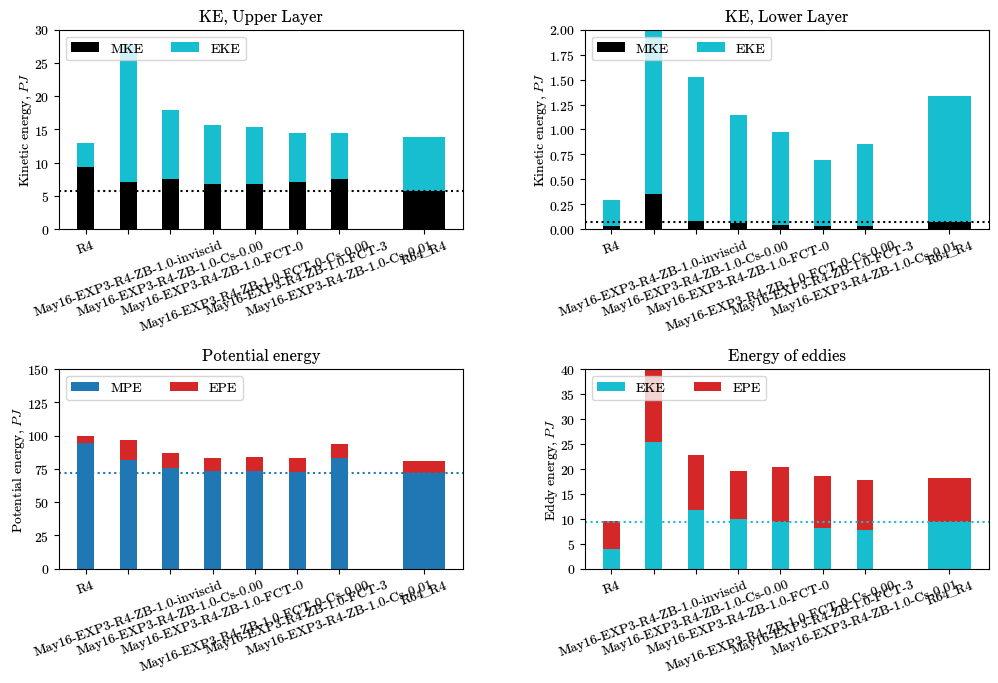

In [52]:
RR = 'R4'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_KE_PE([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

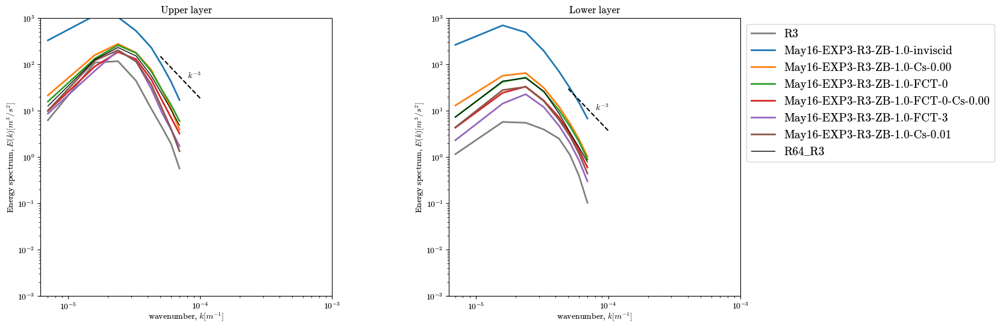

In [53]:
RR = 'R3'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_KE_spectrum([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

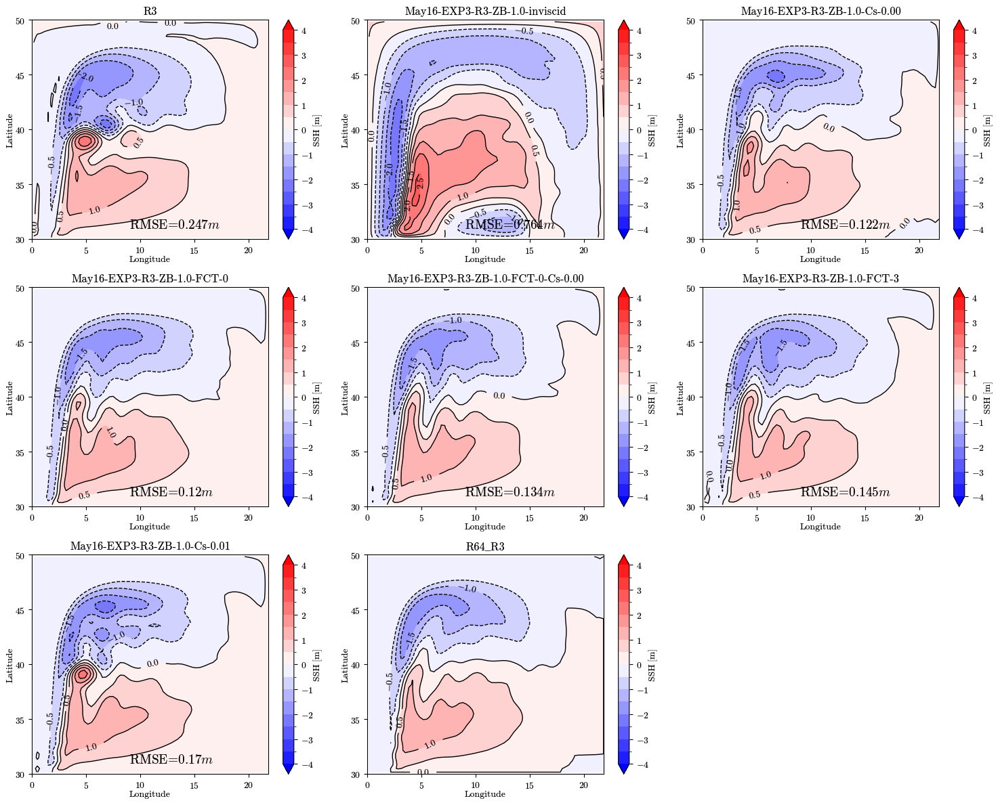

In [54]:
RR = 'R3'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_ssh([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

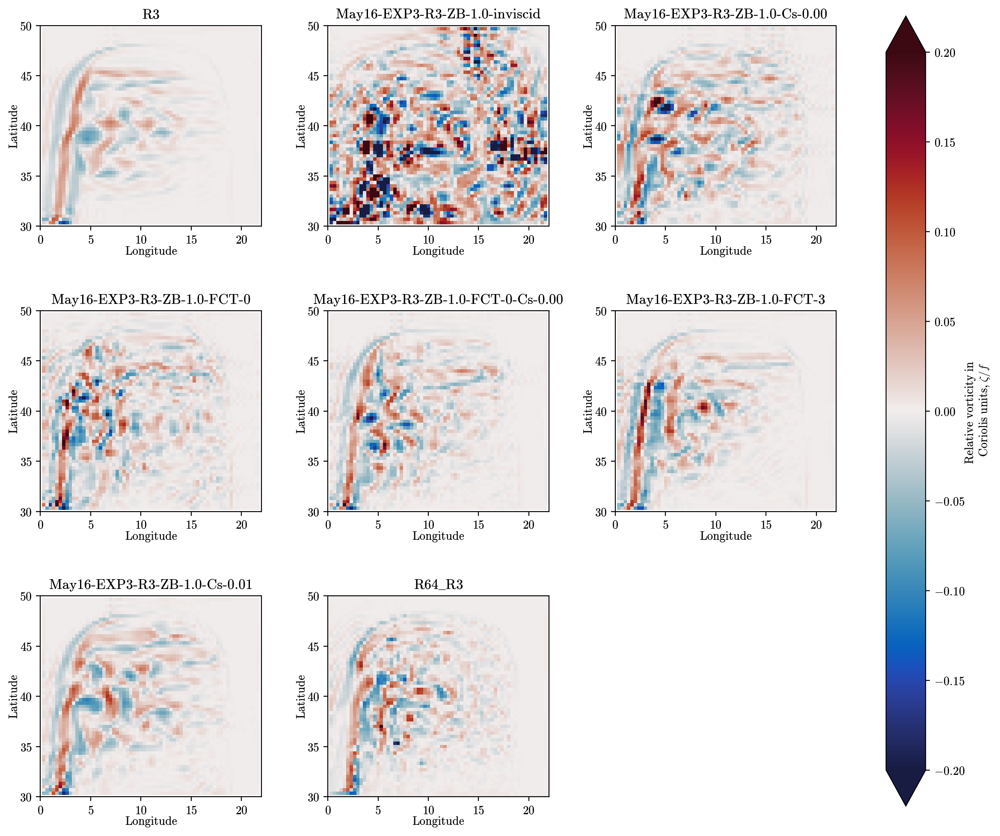

In [55]:
RR = 'R3'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_RV([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

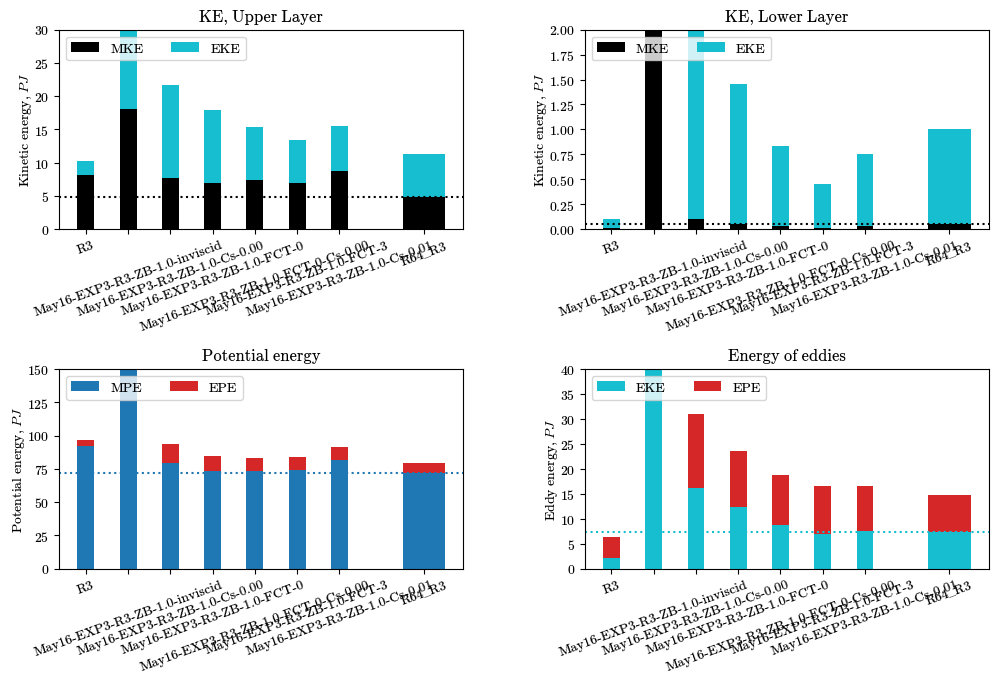

In [56]:
RR = 'R3'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_KE_PE([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

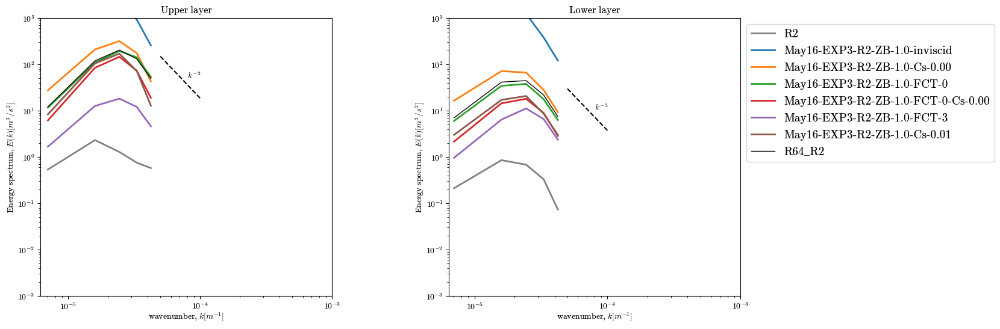

In [57]:
RR = 'R2'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_KE_spectrum([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

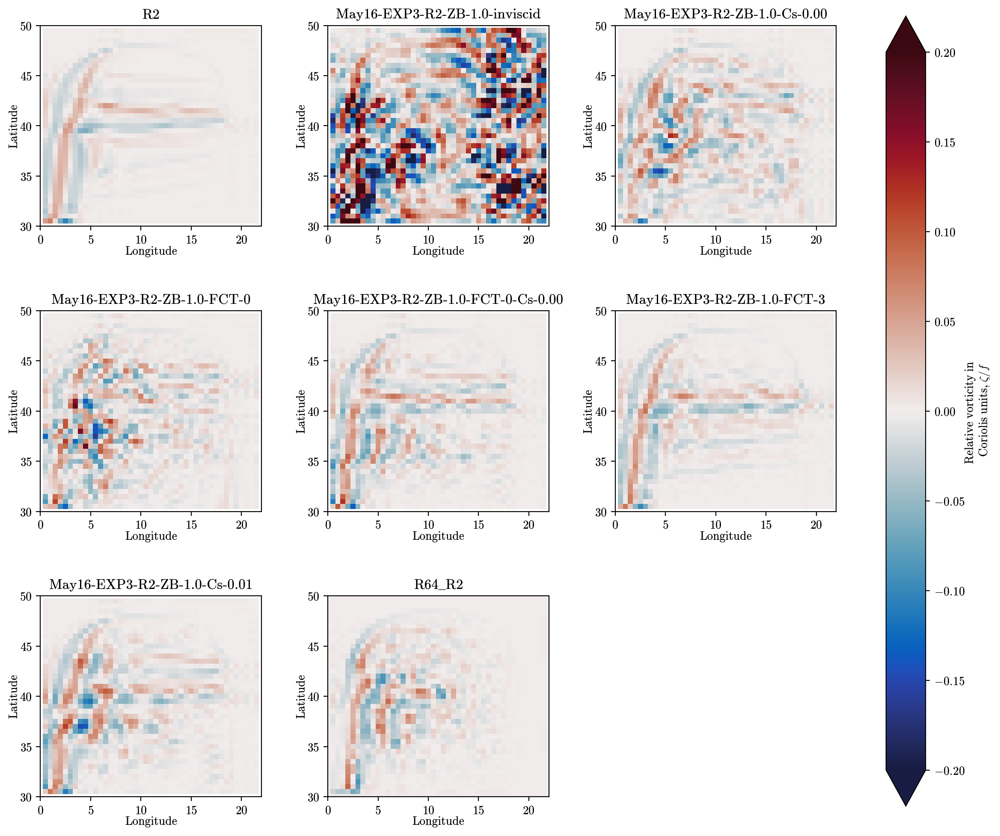

In [58]:
RR = 'R2'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_RV([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

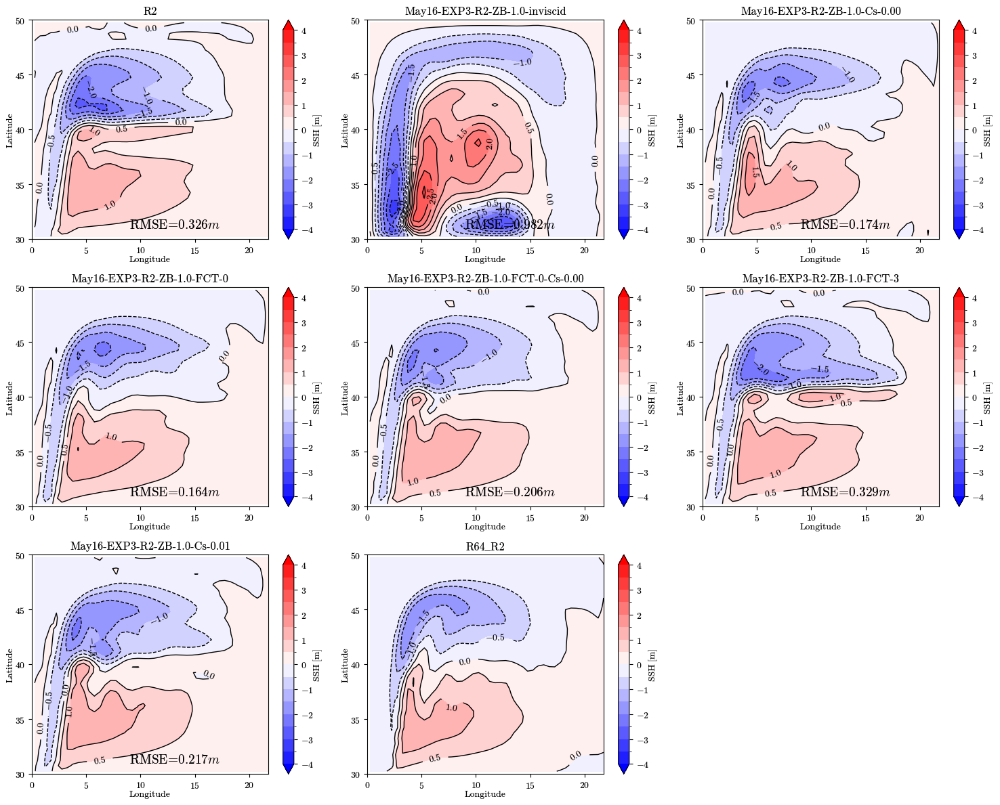

In [59]:
RR = 'R2'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_ssh([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

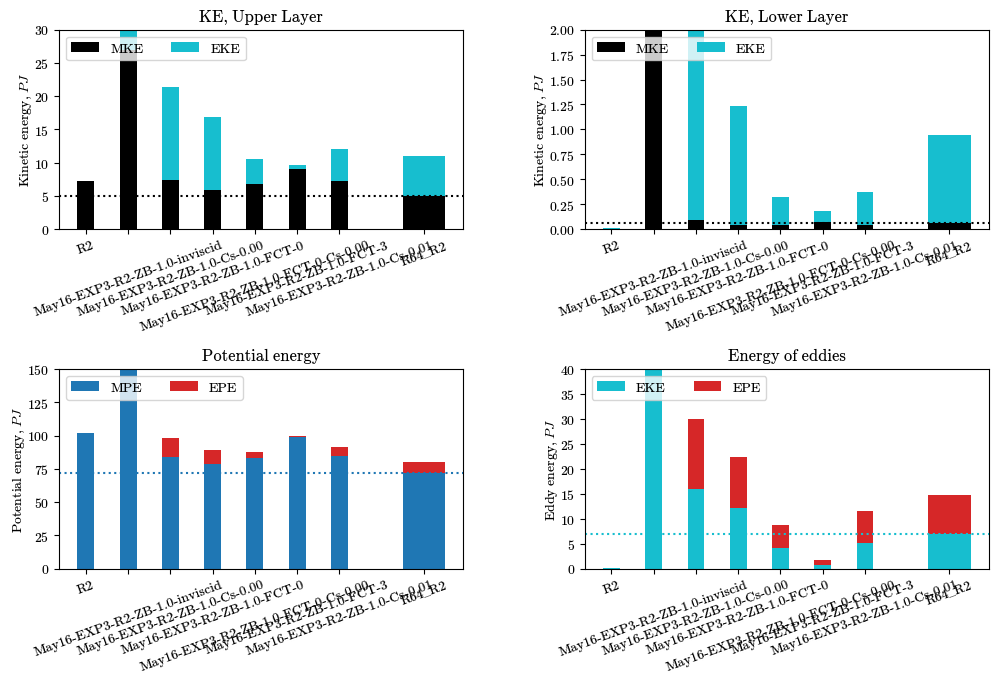

In [60]:
RR = 'R2'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_KE_PE([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

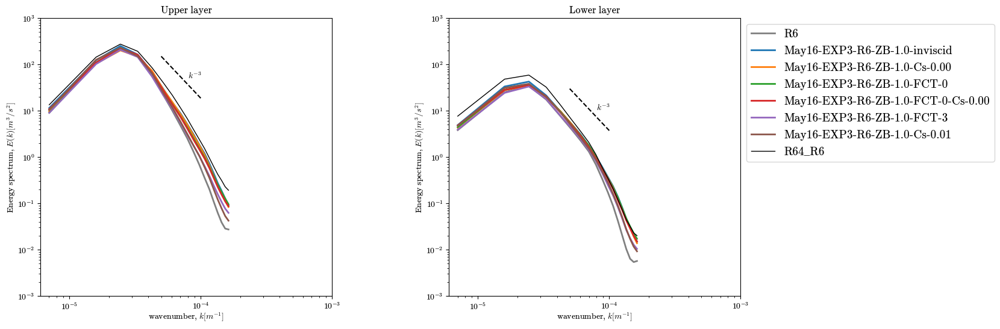

In [61]:
RR = 'R6'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_KE_spectrum([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

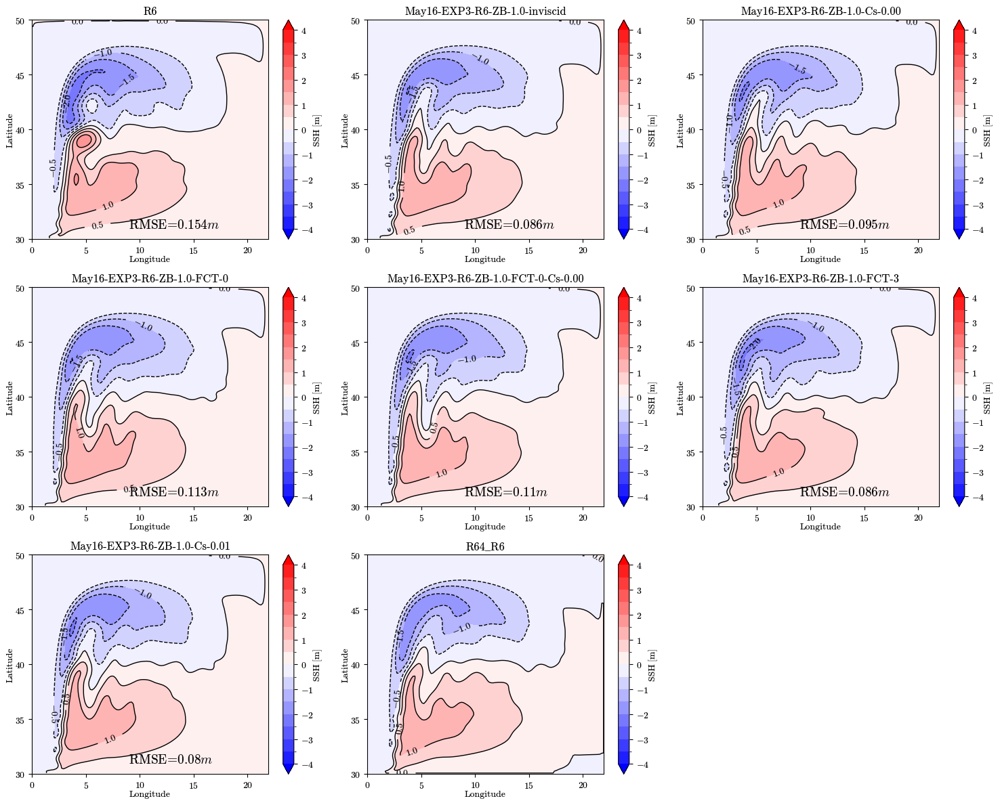

In [62]:
RR = 'R6'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_ssh([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

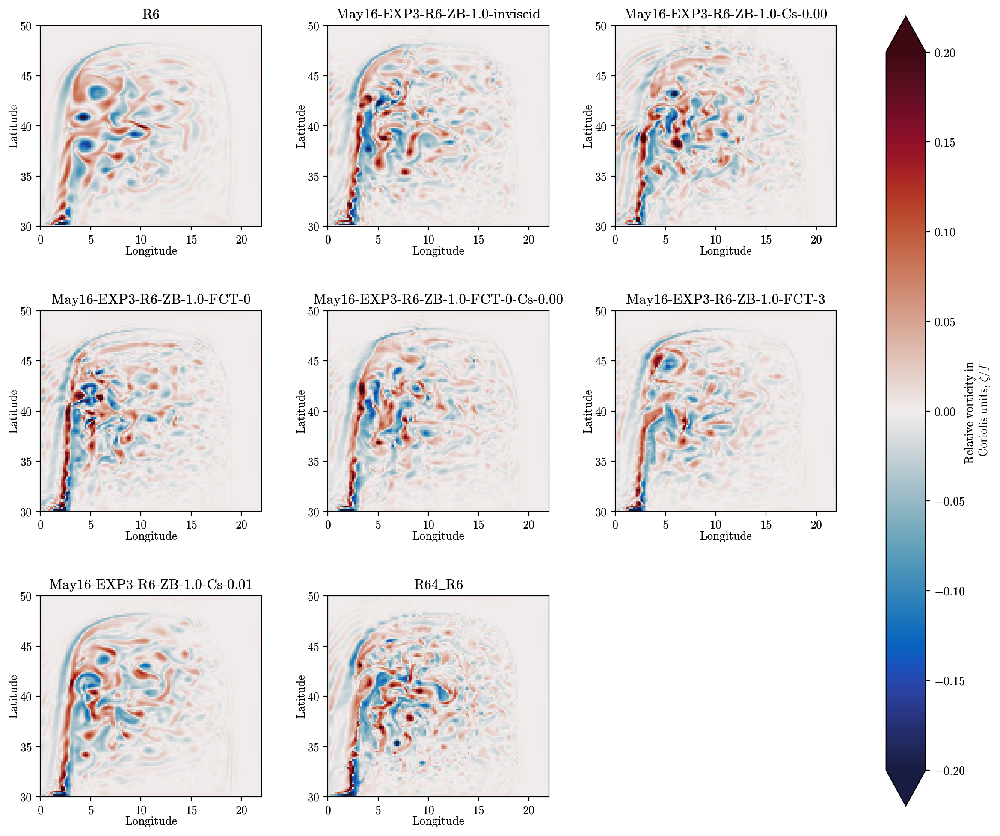

In [63]:
RR = 'R6'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_RV([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

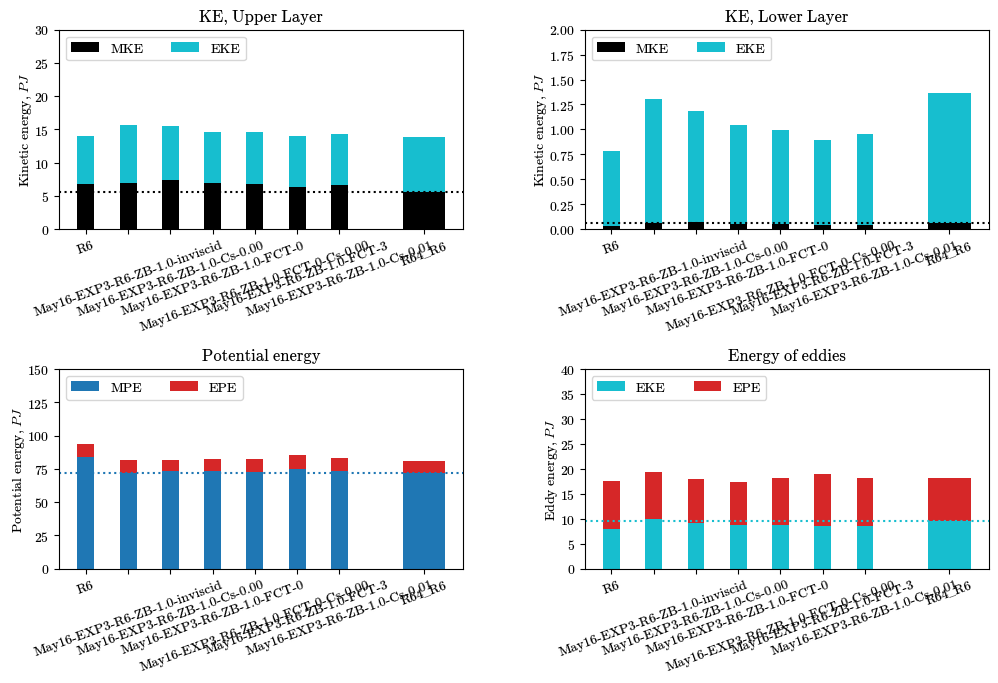

In [64]:
RR = 'R6'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_KE_PE([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

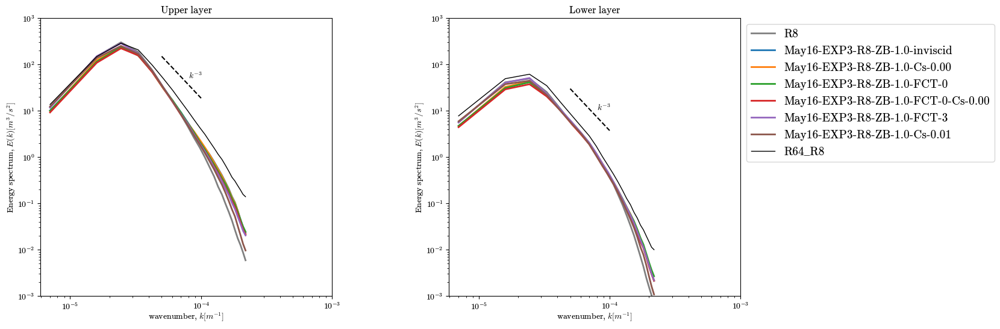

In [65]:
RR = 'R8'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_KE_spectrum([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

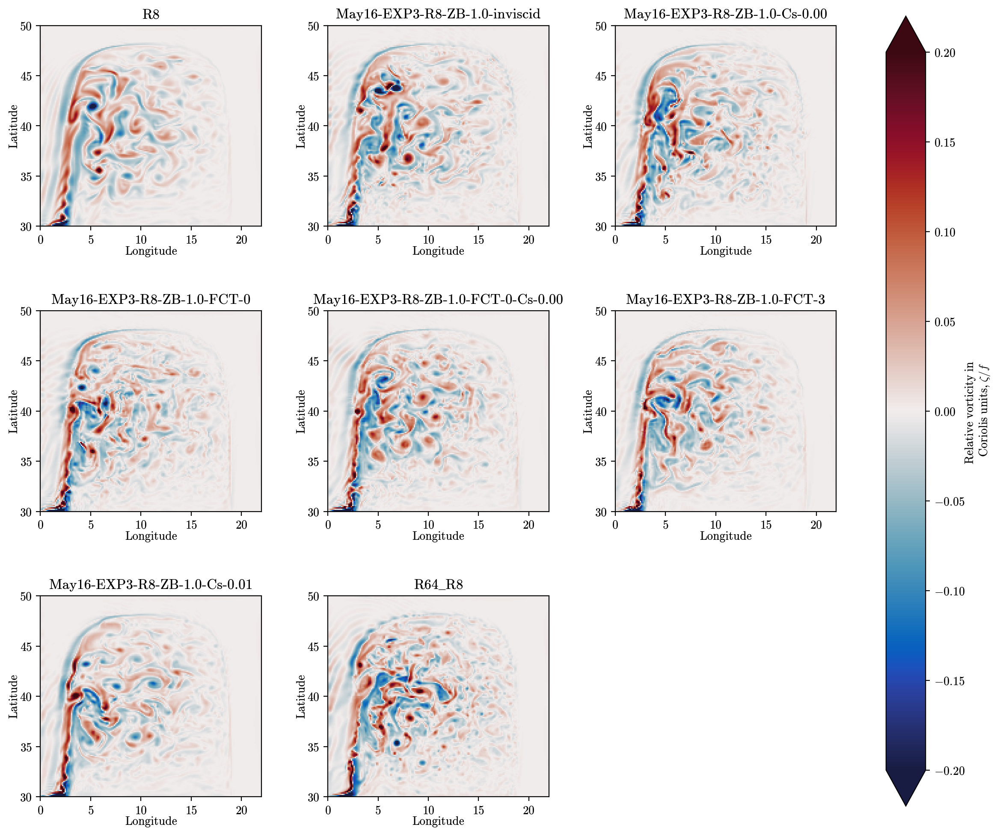

In [66]:
RR = 'R8'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_RV([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

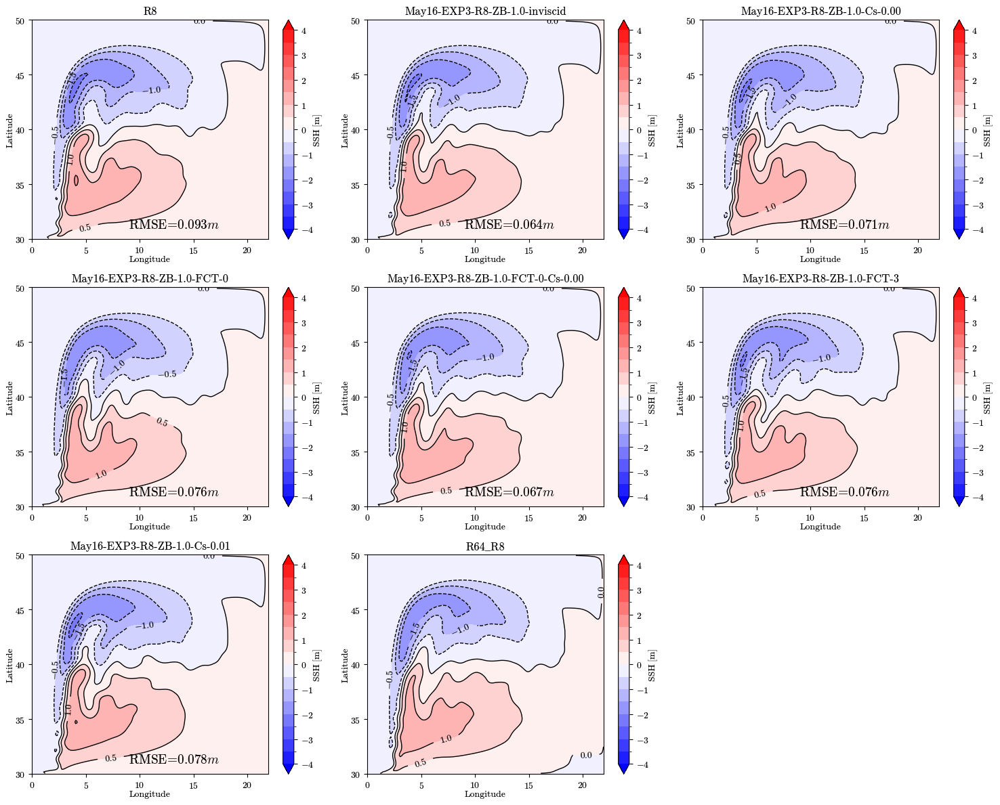

In [67]:
RR = 'R8'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_ssh([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

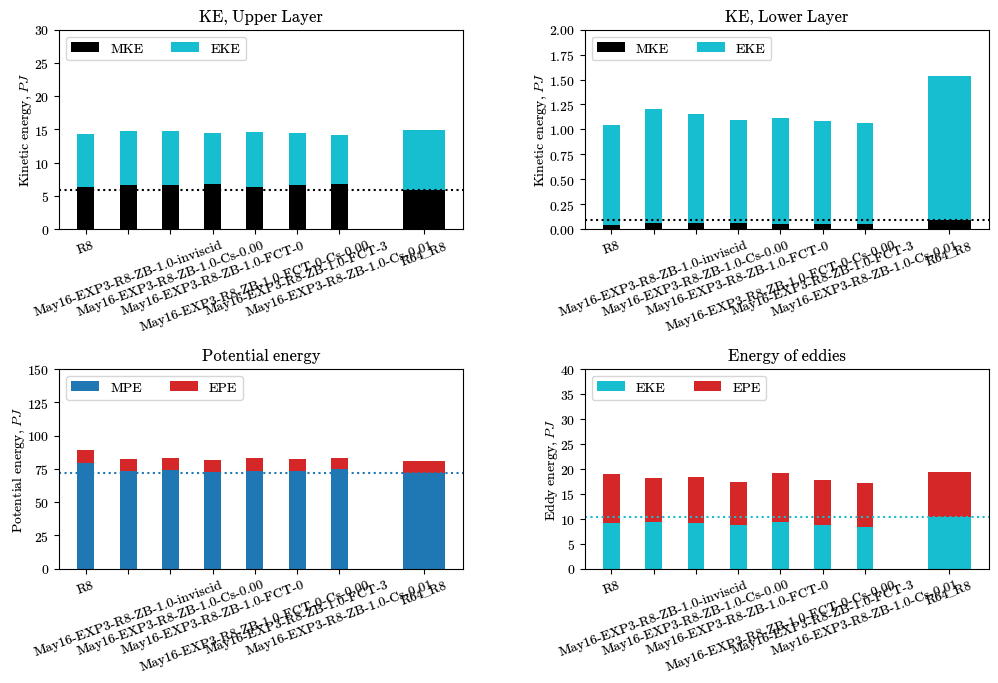

In [68]:
RR = 'R8'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_KE_PE([RR, 
                     f'May16-EXP3-{RR}-ZB-1.0-inviscid', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-0', f'May16-EXP3-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-EXP3-{RR}-ZB-1.0-FCT-3', f'May16-EXP3-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

# Summary
* FCT-3 limiter does not seems to be well numerically formulated: it generates noise when downgradient model is zero
* FCT-0 limiter is better. Without any downgradient model, the solution is smooth.
* Inviscid ANN seems to do not provide backscatter at high resolution, and abruptly change to very strong backscatter around $1/5^o$
* An ideal limiter/viscosity regularization for such ANN is nothing for high resolution and something for coarser resolution.
* Second realization of ANN shows better SSH prediction for most of regularization methods at high resolution. We would assume that it is the best asymptotic model.
* The most mild limiting at coarse resolutions is provided by FCT-0. However, the solution is a bit too energetic. To determine if this variability is correct, we compare additional metrics below.

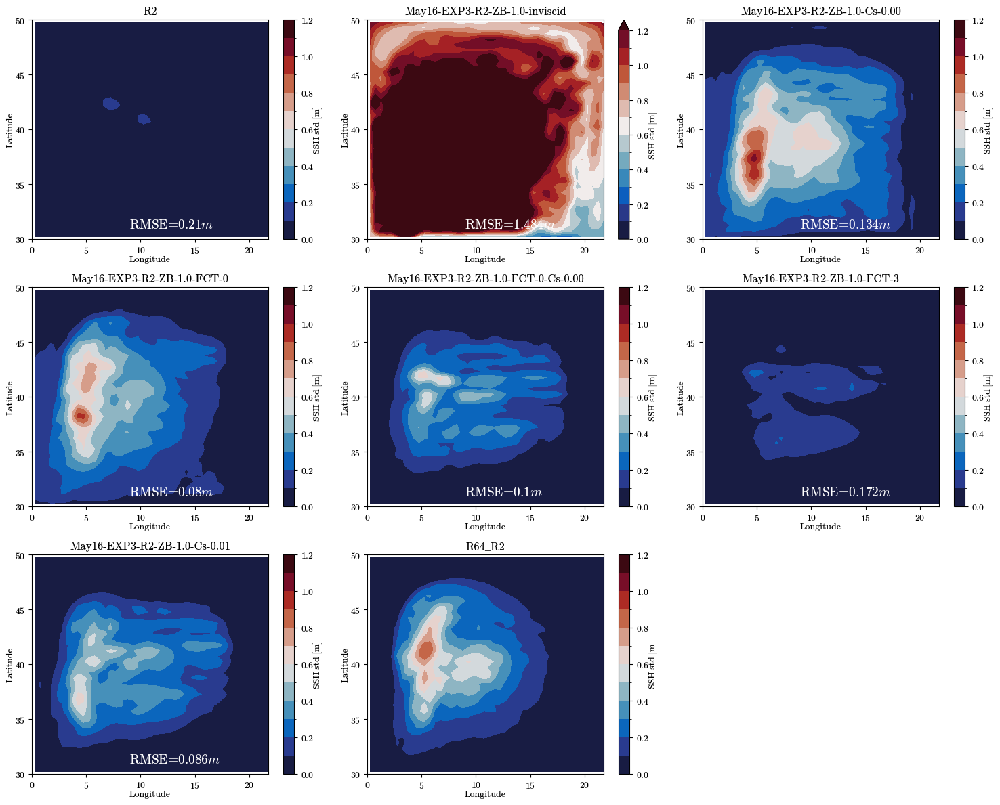

In [70]:
RR = 'R2'
exp = 'EXP3'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_ssh_std([RR, 
                     f'May16-{exp}-{RR}-ZB-1.0-inviscid', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

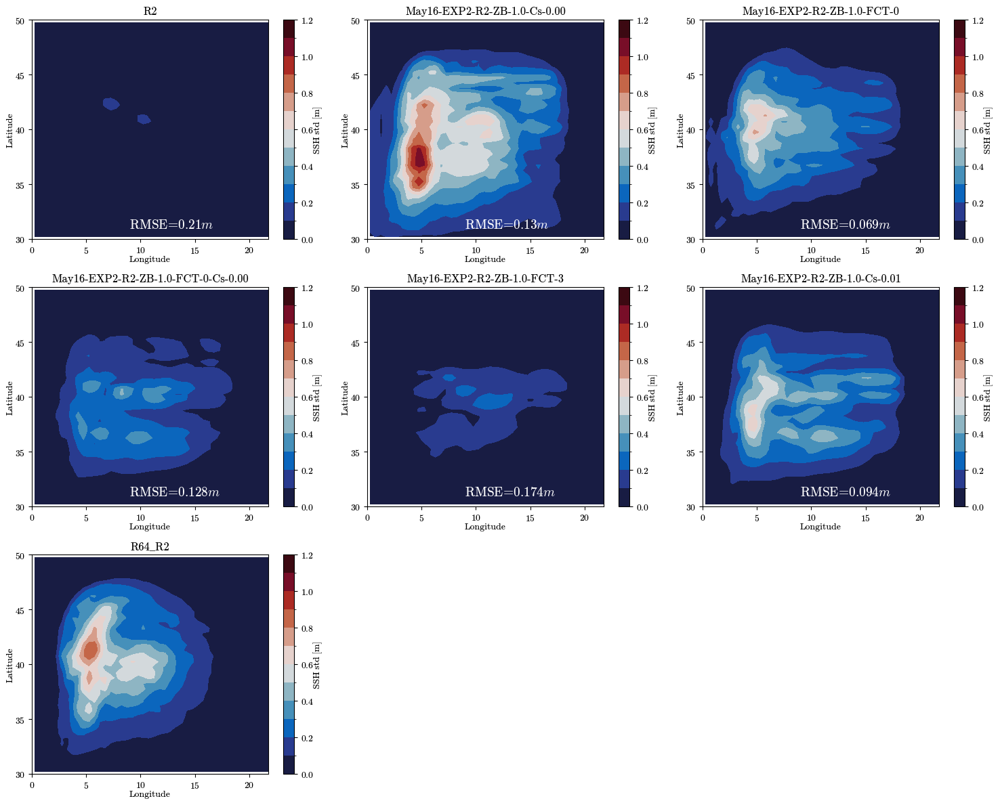

In [72]:
RR = 'R2'
exp = 'EXP2'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_ssh_std([RR, 
                     #f'May16-{exp}-{RR}-ZB-1.0-inviscid', 
                     f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

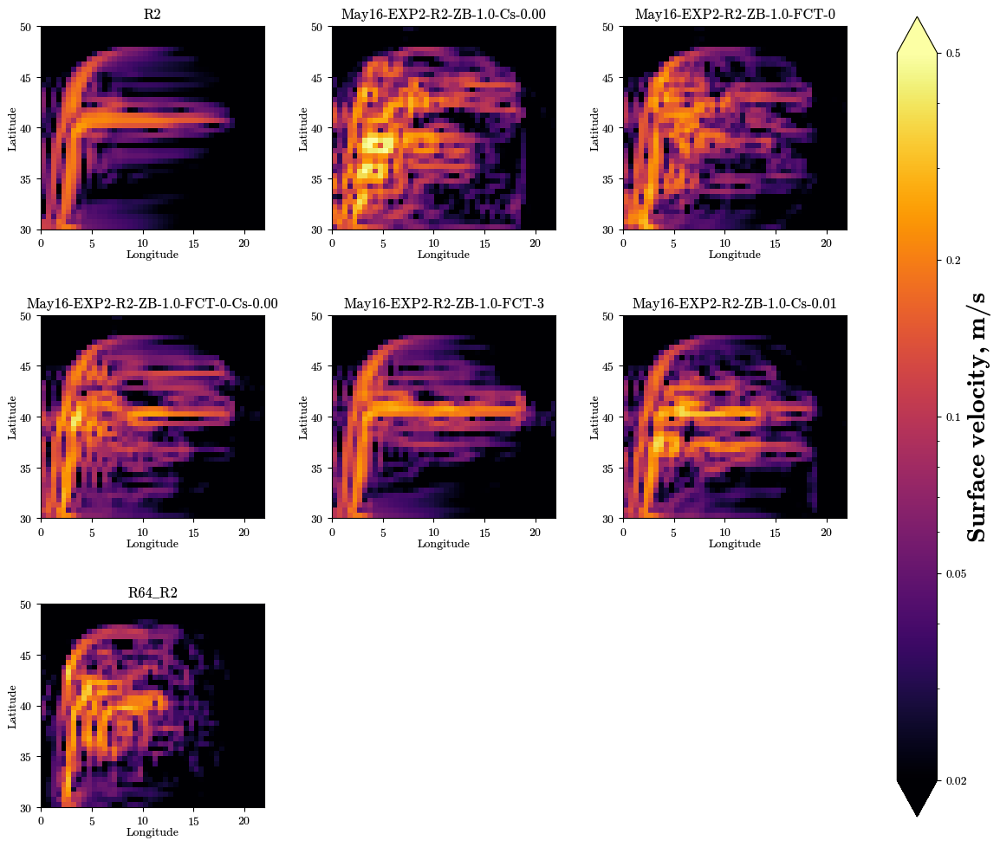

In [73]:
RR = 'R2'
exp = 'EXP2'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_velocity_snapshot([RR, 
                     #f'May16-{exp}-{RR}-ZB-1.0-inviscid', 
                     f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

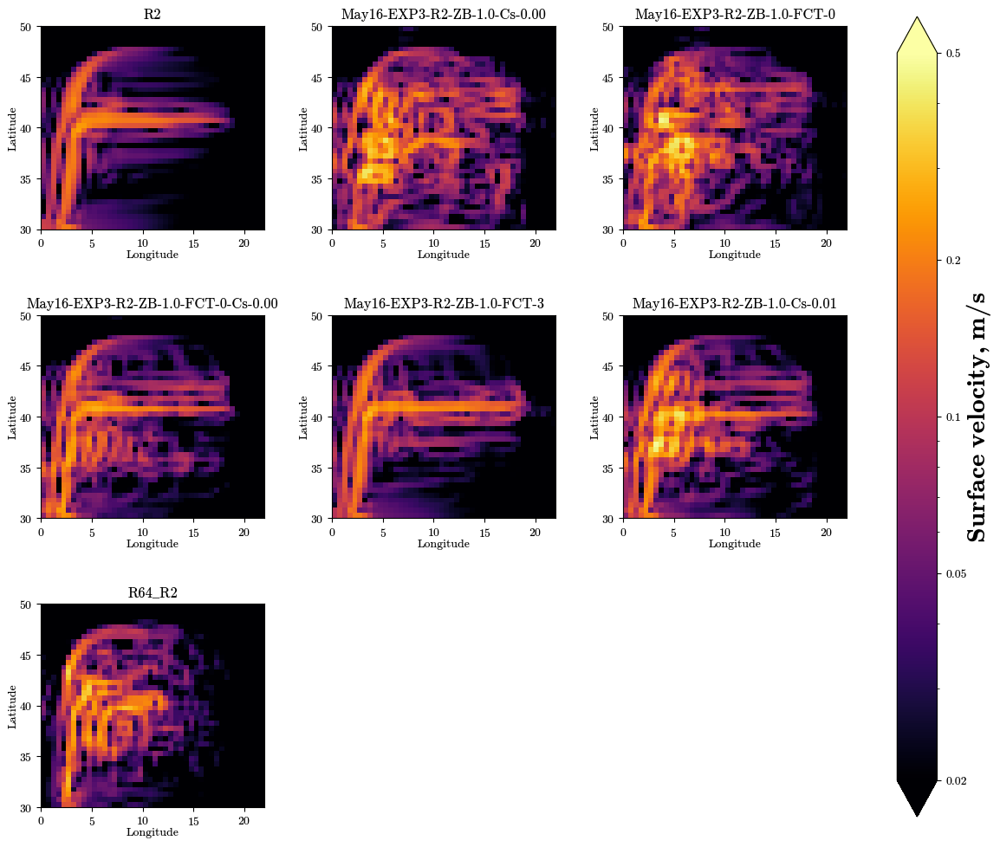

In [74]:
RR = 'R2'
exp = 'EXP3'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_velocity_snapshot([RR, 
                     #f'May16-{exp}-{RR}-ZB-1.0-inviscid', 
                     f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

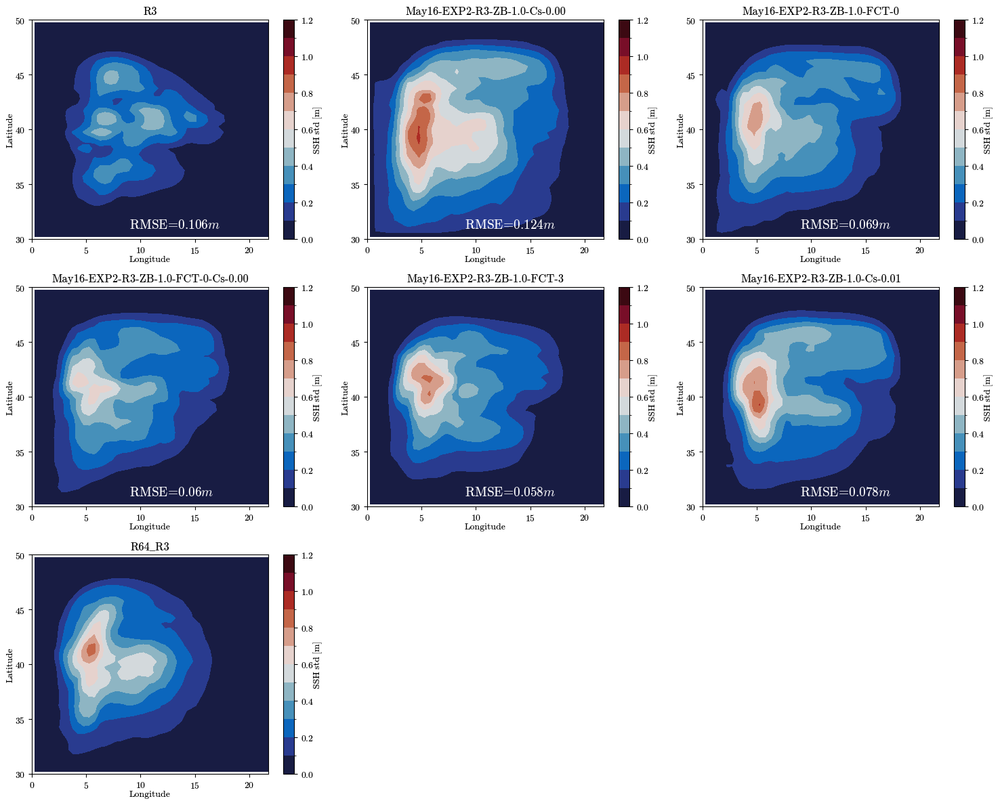

In [75]:
RR = 'R3'
exp = 'EXP2'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_ssh_std([RR, 
                     #f'May16-{exp}-{RR}-ZB-1.0-inviscid', 
                     f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

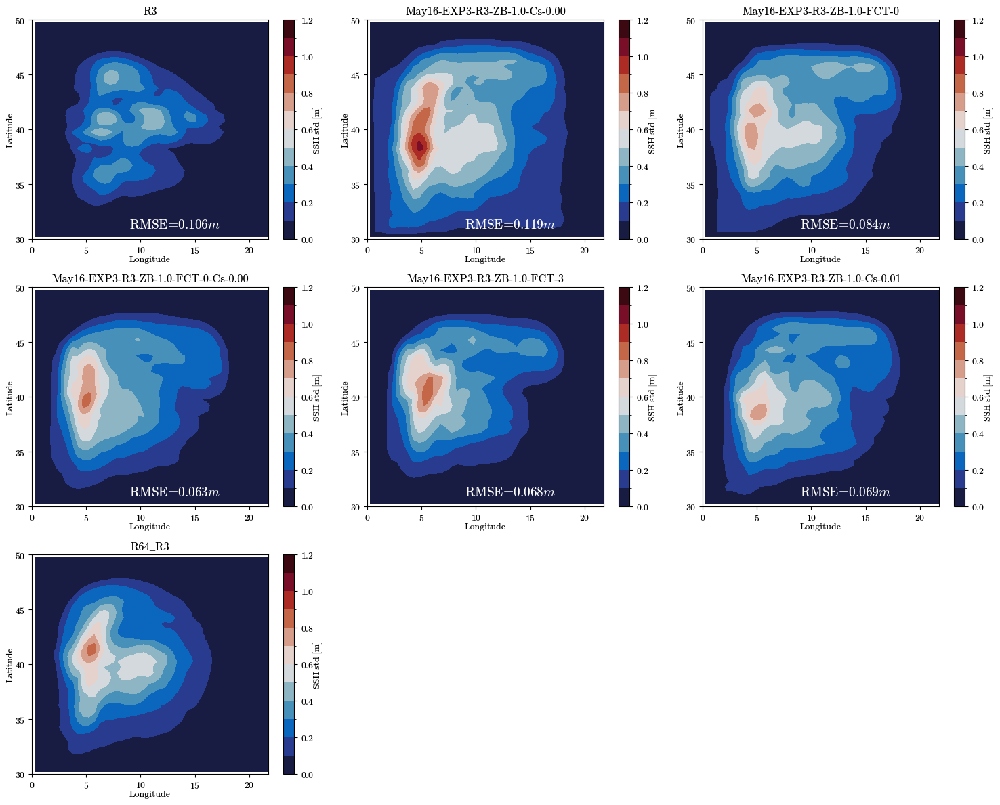

In [76]:
RR = 'R3'
exp = 'EXP3'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_ssh_std([RR, 
                     #f'May16-{exp}-{RR}-ZB-1.0-inviscid', 
                     f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

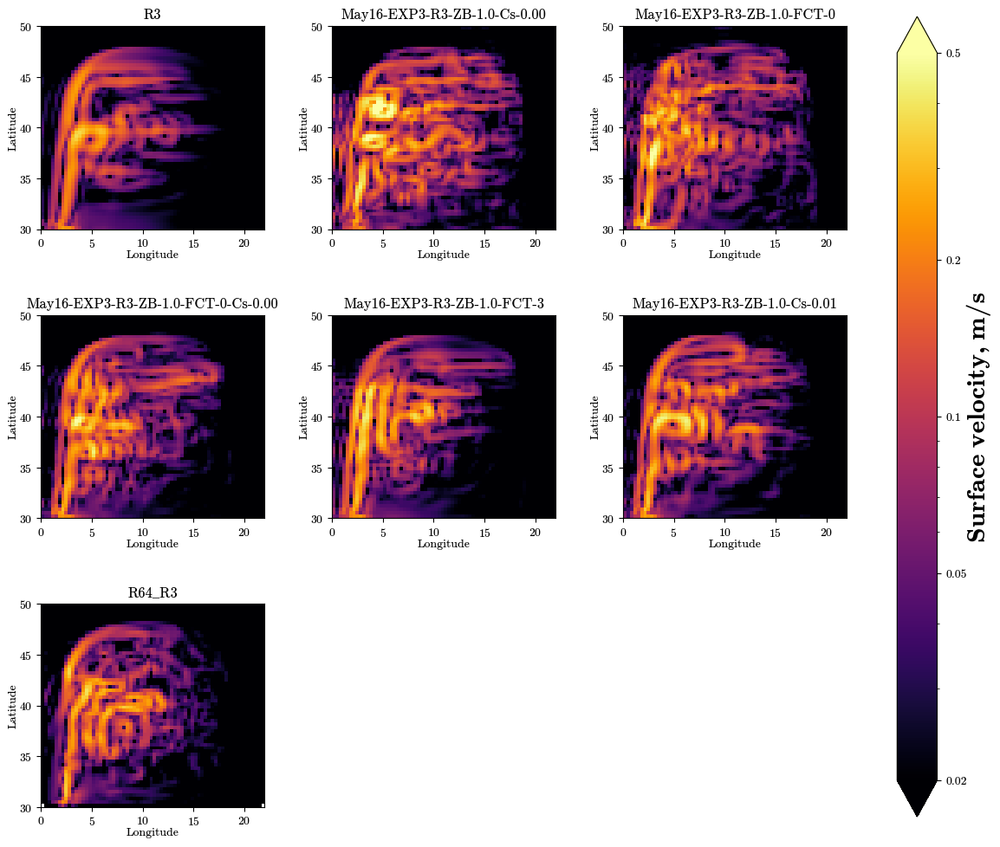

In [77]:
RR = 'R3'
exp = 'EXP3'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_velocity_snapshot([RR, 
                     #f'May16-{exp}-{RR}-ZB-1.0-inviscid', 
                     f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

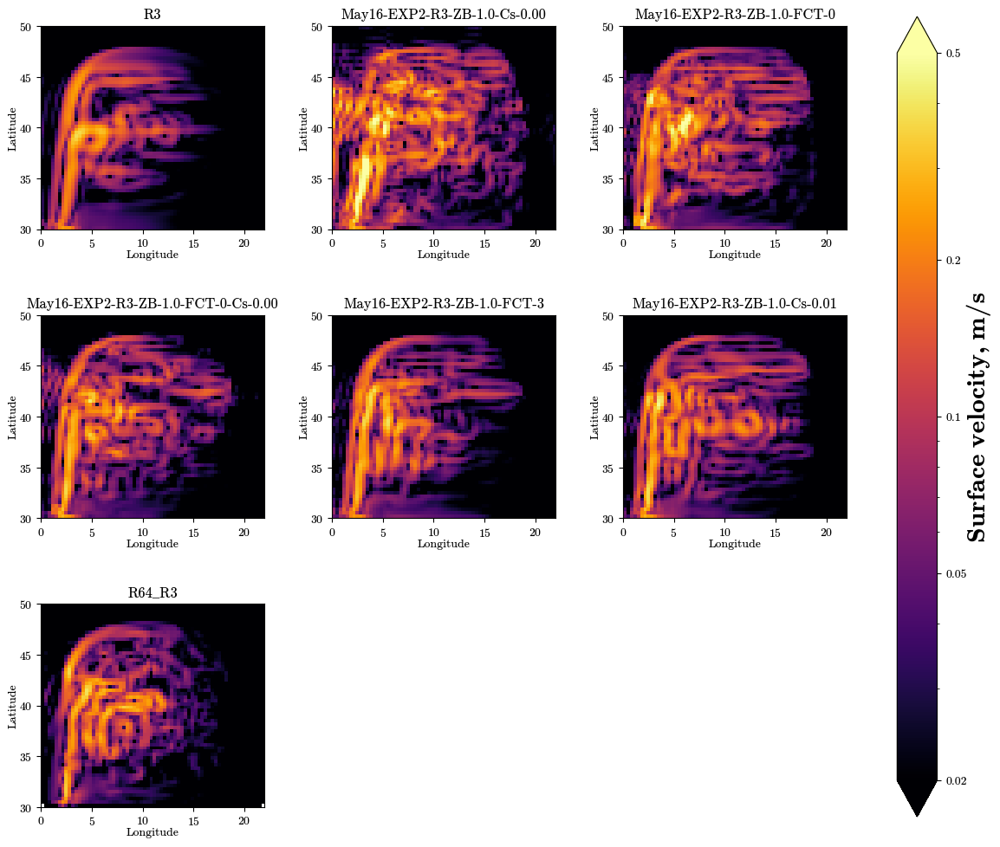

In [78]:
RR = 'R3'
exp = 'EXP2'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_velocity_snapshot([RR, 
                     #f'May16-{exp}-{RR}-ZB-1.0-inviscid', 
                     f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

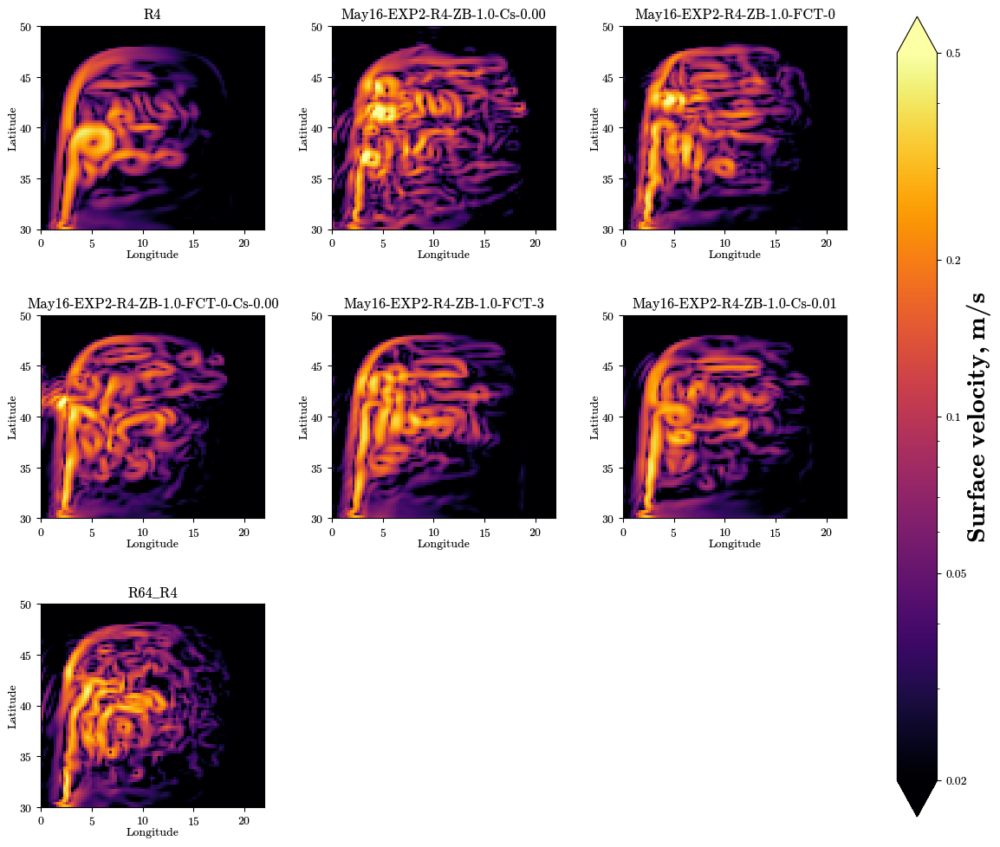

In [79]:
RR = 'R4'
exp = 'EXP2'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_velocity_snapshot([RR, 
                     #f'May16-{exp}-{RR}-ZB-1.0-inviscid', 
                     f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

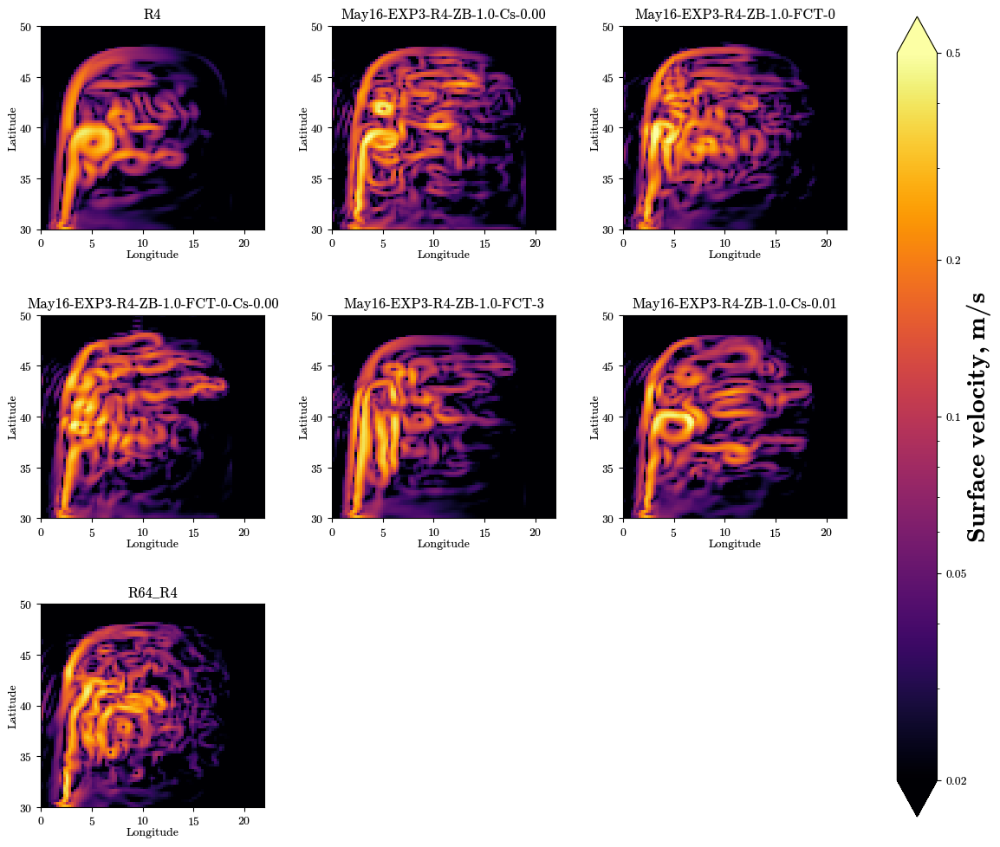

In [80]:
RR = 'R4'
exp = 'EXP3'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_velocity_snapshot([RR, 
                     #f'May16-{exp}-{RR}-ZB-1.0-inviscid', 
                     f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

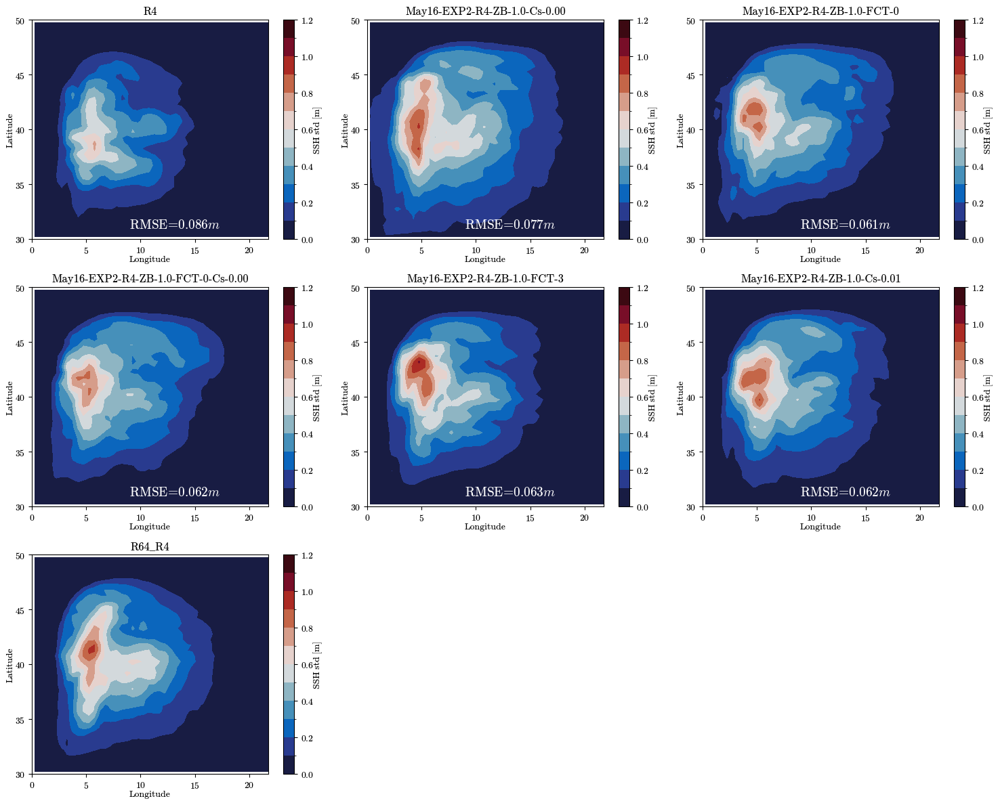

In [81]:
RR = 'R4'
exp = 'EXP2'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_ssh_std([RR, 
                     #f'May16-{exp}-{RR}-ZB-1.0-inviscid', 
                     f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

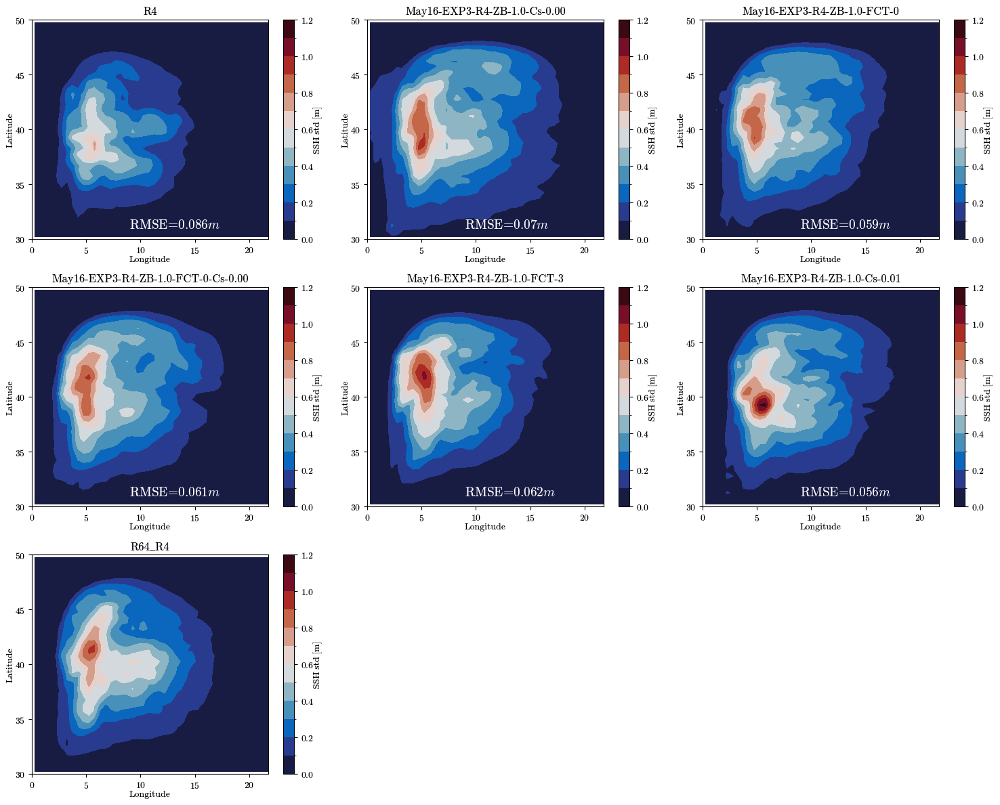

In [82]:
RR = 'R4'
exp = 'EXP3'
default_rcParams({'font.size': 10, 'figure.subplot.wspace': 0.4, 'figure.subplot.hspace': 0.1})
ds.plot_ssh_std([RR, 
                     #f'May16-{exp}-{RR}-ZB-1.0-inviscid', 
                     f'May16-{exp}-{RR}-ZB-1.0-Cs-0.00',
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-0', f'May16-{exp}-{RR}-ZB-1.0-FCT-0-Cs-0.00', 
                     f'May16-{exp}-{RR}-ZB-1.0-FCT-3', f'May16-{exp}-{RR}-ZB-1.0-Cs-0.01', 
                     f'R64_{RR}']);

# Summary

It is difficult to make a good choice but I choose EXP3 + FCT-0. There are few reasons:
* It is the least dissipative at the limit of coarse resolution.
* It provides reliable bound on norm of solution.
* It is applied more accurately than the FCT-3 limiter (which is noisy without background diffusion)
* Compared to FCT-3, there is saturation of dissipative properties at coarse resolution.
* It's energetic properties + stability may be a big benefit for NW2.
* I choose EXP3 but not EXP2 because:
  * For all regulartizations, mean SSH is better for EXP3 so it is better calibrated a priori
  * Without viscosity it is more stable at coarse resolutions and shows more uniform performance at high resolutions